In [81]:
import numpy as np
from numpy import mean
from numpy import isnan
from numpy import asarray
from numpy import polyfit
from scipy.stats import pearsonr
from scipy import stats
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.decomposition import PCA, FastICA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.manifold import LocallyLinearEmbedding as LLE
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score, mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.manifold import TSNE
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import cross_val_score
import seaborn as sns
import time
import sys
import warnings
from yellowbrick.text import TSNEVisualizer

In [2]:
import warnings
import colormap as cmap
plt.register_cmap(name='viridis')
warnings.filterwarnings('ignore')

In [3]:
def load_data():
    data = pd.read_csv("data/ethylene_CO.txt", delim_whitespace=True, header=None, skiprows=[0])
    data = data.rename(
        columns={0: 'Time_seconds', 1: 'CO_conc_ppm', 2: 'Ethylene_conc_ppm', 3: 'Sensor1', 4: 'Sensor2',
                 5: 'Sensor3', 6: 'Sensor4', 7: 'Sensor5', 8: 'Sensor6', 9: 'Sensor7', 10: 'Sensor8', 11: 'Sensor9',
                 12: 'Sensor10', 13: 'Sensor11', 14: 'Sensor12', 15: 'Sensor13', 16: 'Sensor14', 17: 'Sensor15',
                 18: 'Sensor16'})
    data.head()
    return data

In [73]:
def draw_co_concentrations(data):
    # draw CO concentration as time series
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.plot(data['CO_conc_ppm'], linewidth=4)
    plt.xlabel("Time in seconds",fontsize=40)
    plt.ylabel("CO (ppm)", fontsize=40)
    plt.rcParams["figure.figsize"] = (40, 20)
  
    
   



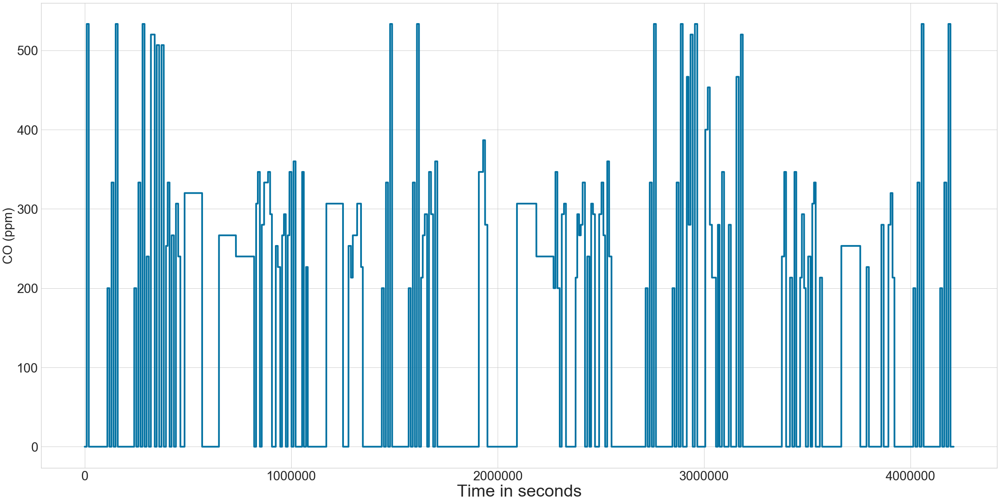

In [70]:
draw_co_concentrations(data)

In [76]:
def draw_eth_concentrations(data):
    # draw Ethylene concentration time graph
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)
    plt.plot(data['Ethylene_conc_ppm'], linewidth=4,color='#4b0082')
    plt.xlabel("Time in seconds", fontsize=40)
    plt.ylabel('Ethylene (ppm)',fontsize=40)
    plt.rcParams["figure.figsize"] = (40, 20)



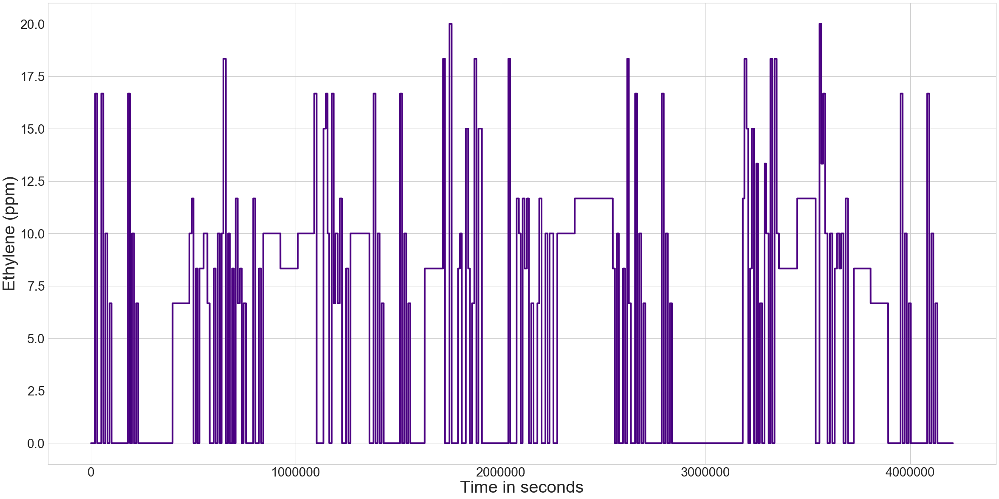

In [77]:
draw_eth_concentrations(data)

In [5]:
def draw_sensor_time_graph(data):
    columns = data.columns[3:]
    fig, axes = plt.subplots(nrows=16)
    fig.set_figheight(200)
    fig.set_figwidth(50)
    fig.subplots_adjust(hspace=.5)
    for i in range(16):
        color = np.random.rand(3, )
        axes[i].plot(data['Time_seconds'], data[columns[i]], c=color)
        axes[i].set_title(f"{columns[i]} time graph")
        axes[i].set_xlabel("Time")
        axes[i].set_ylabel("Sensor reading")


Lets build classes from the CO and Ethlyne concentrations

In [6]:
def create_classes(data):
    y = []
    for i in range(data.shape[0]):
        y.append(i)
        if (data['CO_conc_ppm'][i] == 0 and data['Ethylene_conc_ppm'][i] == 0):
            y[i] = 0
        elif (data['CO_conc_ppm'][i] != 0 and data['Ethylene_conc_ppm'][i] == 0):
            y[i] = 1
        elif (data['CO_conc_ppm'][i] == 0 and data['Ethylene_conc_ppm'][i] != 0):
            y[i] = 2
        elif (data['CO_conc_ppm'][i] != 0 and data['Ethylene_conc_ppm'][i] != 0):
            y[i] = 3
        else:
            y[i] = 4
    data["Response"] = y
    data["Response"].value_counts()
    return data


In [7]:
def get_labels(data):
    X = data[
        [u'Sensor1', u'Sensor2', u'Sensor3', u'Sensor4', u'Sensor5', u'Sensor6', u'Sensor7', u'Sensor8', u'Sensor9',
         u'Sensor10', u'Sensor11', u'Sensor12', u'Sensor13', u'Sensor14', u'Sensor15', u'Sensor16']]
    y = data[['Response']]
    return X, y


In [8]:
def find_importance(X, y):
    y_fs = y.astype('int64')
    plt.figure(figsize=(10, 7))
    model = ExtraTreesClassifier()
    model.fit(X, y_fs)
    print(model.feature_importances_)
    # use inbuilt class feature_importances of tree based classifiers
    # plot graph of feature importances for better visualization
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    feat_importances.nlargest(16).plot(kind='barh')

    plt.xlabel('Importance Rank')
    plt.ylabel('Feature')
    plt.title('Feature Importance')
    plt.rcParams.update({'font.size': 12})
    plt.show()

In [9]:
def reduce_dimension(X, type, dim,y=None):
    scaling = StandardScaler().fit(X)
    X = scaling.transform(X)
    if type == "ica":
        ica = FastICA(n_components=dim)
        result = ica.fit_transform(X)
        A_ = ica.mixing_  #
    if type == "pca":
        pca = PCA(n_components=dim)
        result = pca.fit_transform(X)
    if type == "lda":
        lda = LDA(n_components=dim)
        result = lda.fit_transform(X,y)
    if type == "lle":
        lle = LLE(n_components=dim)
        result = lle.fit_transform(X)
    if type == 'tsne':
        tsne = TSNE(n_components=dim)
        result = tsne.fit_transform(X)
    return result


First lets scale the data for the calculation

In [10]:
def split_data(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
    return X_train, X_val, X_test, y_train, y_val, y_test


In [11]:
def train_data(X_train, X_val, y_train, y_val, clf):
    start = time.time()
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)
    mse = mean_squared_error(y_val, y_pred)
    time_passed = time.time() - start
    print(f"Accuracy Score for classifier =", accuracy * 100)
    print(f"MSE for  classifier  =", mse)
    print(f"Operation completed in {time_passed} seconds")
    return accuracy, mse, time_passed

In [12]:
def test_data(clf, x_test, y_test):
    y_pred = clf.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    return accuracy, mse

In [13]:
def sample_data(data,size):
    sss = StratifiedShuffleSplit(n_splits=1, test_size=size, random_state=0)
    for sample1_index,sample2_index in sss.split(data,data['Response']):
        sample1 = data.loc[sample1_index]
        sample2 = data.loc[sample2_index]
    return sample1,sample2

In [14]:
data = load_data()


In [15]:
data = create_classes(data)

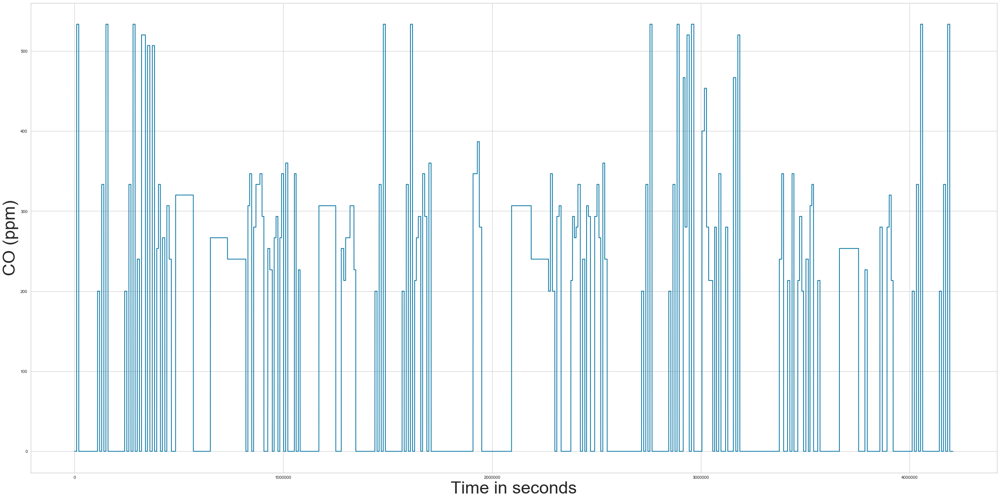

In [40]:
draw_co_concentrations(data)

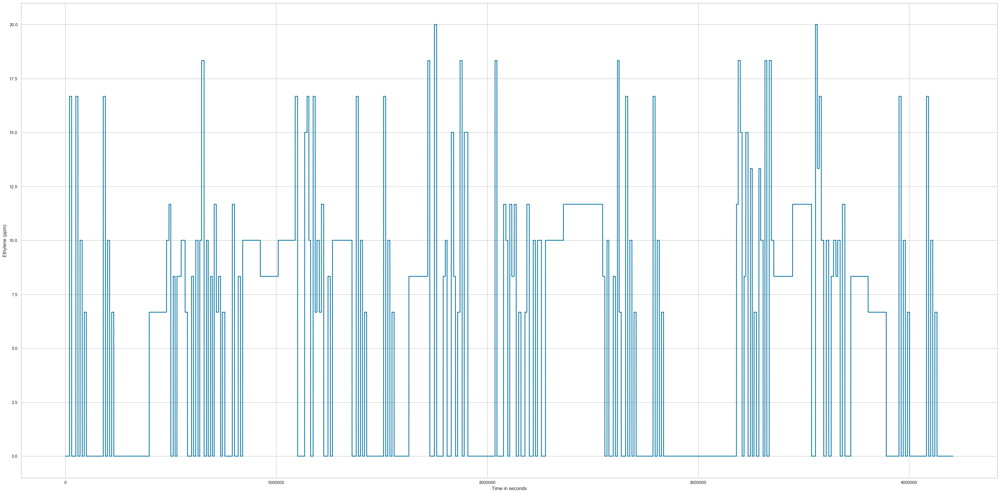

In [36]:
draw_eth_concentrations(data)

In [34]:
data.any().isnull()

Time_seconds         False
CO_conc_ppm          False
Ethylene_conc_ppm    False
Sensor1              False
Sensor2              False
Sensor3              False
Sensor4              False
Sensor5              False
Sensor6              False
Sensor7              False
Sensor8              False
Sensor9              False
Sensor10             False
Sensor11             False
Sensor12             False
Sensor13             False
Sensor14             False
Sensor15             False
Sensor16             False
Response             False
dtype: bool

In [79]:
sample1,sample2 = sample_data(data,0.01)

In [80]:
sample2.shape

(42083, 20)

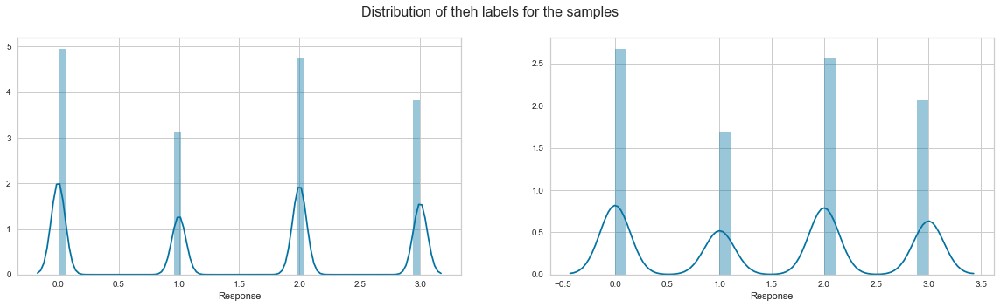

In [85]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(20,5))
fig.suptitle('Distribution of theh labels for the samples',fontsize=16)
sns.distplot(sample1['Response'],ax=ax1)
sns.distplot(sample2['Response'],ax=ax2)

In [38]:
sample1.describe()

,Time_seconds,CO_conc_ppm,Ethylene_conc_ppm,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,Sensor6,Sensor7,Sensor8,Sensor9,Sensor10,Sensor11,Sensor12,Sensor13,Sensor14,Sensor15,Sensor16,Response
count,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06,4.166178e+06
mean,2.104468e+04,1.276249e+02,5.320346e+00,2.065628e+03,5.062910e+02,4.372607e+03,4.799325e+03,1.894974e+03,2.214707e+03,5.086717e+03,5.385509e+03,1.186250e+03,1.219261e+03,4.871156e+03,3.926310e+03,9.281954e+02,1.035780e+03,5.289407e+03,4.309747e+03,1.447843e+00
std,1.215016e+04,1.607850e+02,5.623984e+00,7.902429e+02,1.530253e+03,1.607988e+03,1.732984e+03,4.395282e+02,4.353953e+02,1.966411e+03,2.072341e+03,4.534186e+02,4.310907e+02,1.707661e+03,1.364474e+03,1.678682e+02,1.741868e+02,1.984038e+03,1.584010e+03,1.140488e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,-5.262000e+01,-3.649000e+01,-4.504000e+01,-8.940000e+00,-1.219000e+01,-4.214000e+01,-2.322000e+01,-1.382000e+01,1.597400e+02,2.153100e+02,8.622200e+02,8.654900e+02,6.095700e+02,6.738900e+02,5.467300e+02,4.885800e+02,0.000000e+00
25%,1.052098e+04,0.000000e+00,0.000000e+00,1.323680e+03,9.120000e+00,2.987230e+03,3.282600e+03,1.503460e+03,1.856650e+03,3.242240e+03,3.448910e+03,9.343300e+02,9.419200e+02,3.435970e+03,2.729190e+03,8.083400e+02,9.102500e+02,3.642120e+03,2.805340e+03,0.000000e+00
50%,2.104610e+04,0.000000e+00,6.670000e+00,1.789090e+03,3.889000e+01,4.494670e+03,4.947090e+03,1.984550e+03,2.272540e+03,5.224880e+03,5.537910e+03,1.140320e+03,1.176600e+03,5.016500e+03,4.120240e+03,9.298600e+02,1.060700e+03,5.320930e+03,4.543040e+03,2.000000e+00
75%,3.156766e+04,2.666700e+02,1.000000e+01,2.869440e+03,1.589000e+02,5.658690e+03,6.178210e+03,2.262740e+03,2.566470e+03,6.719730e+03,7.104200e+03,1.543660e+03,1.557780e+03,6.126830e+03,4.967480e+03,1.033490e+03,1.161370e+03,6.739320e+03,5.565070e+03,2.000000e+00
max,4.208755e+04,5.333300e+02,2.000000e+01,3.553640e+03,2.811651e+04,8.641340e+03,9.221020e+03,2.904040e+03,3.502110e+03,9.883500e+03,1.052104e+04,5.513995e+04,5.066950e+04,9.626260e+03,9.762620e+03,2.454402e+04,2.142068e+04,1.066530e+04,7.874490e+03,3.000000e+00


In [39]:
sample2.describe()

,Time_seconds,CO_conc_ppm,Ethylene_conc_ppm,Sensor1,Sensor2,Sensor3,Sensor4,Sensor5,Sensor6,Sensor7,Sensor8,Sensor9,Sensor10,Sensor11,Sensor12,Sensor13,Sensor14,Sensor15,Sensor16,Response
count,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000,42083.000000
mean,21035.297266,127.159855,5.329364,2064.456589,499.023360,4365.810746,4791.739089,1893.306337,2213.296285,5078.933061,5377.456418,1185.438364,1218.350438,4863.471877,3920.336903,927.423982,1034.970215,5281.071474,4303.547805,1.447853
std,12132.761338,160.009649,5.638398,792.050888,1517.751841,1611.005424,1736.258963,440.430969,435.736703,1970.477719,2076.570339,428.046654,409.115008,1709.676553,1366.720485,156.264664,166.173897,1985.868963,1586.816259,1.140506
min,1.050000,0.000000,0.000000,-35.520000,-31.150000,-27.920000,12.060000,11.410000,-11.710000,-7.480000,-3.090000,169.830000,224.320000,874.340000,876.450000,625.160000,678.160000,558.330000,506.340000,0.000000
25%,10551.905000,0.000000,0.000000,1321.065000,9.205000,2976.535000,3265.680000,1499.050000,1852.310000,3223.285000,3427.305000,933.650000,940.760000,3425.545000,2718.920000,807.200000,908.700000,3630.160000,2787.880000,0.000000
50%,21019.020000,0.000000,6.670000,1787.730000,39.220000,4479.300000,4928.560000,1981.980000,2273.270000,5210.930000,5523.780000,1136.890000,1173.140000,5001.830000,4102.740000,929.080000,1059.510000,5291.570000,4539.260000,2.000000
75%,31478.690000,266.670000,10.000000,2872.815000,158.060000,5653.700000,6172.680000,2260.780000,2565.060000,6709.045000,7093.970000,1544.530000,1558.000000,6121.750000,4965.650000,1032.700000,1160.970000,6733.390000,5561.920000,2.000000
max,42084.660000,533.330000,20.000000,3540.790000,27458.850000,8636.820000,9192.200000,2899.970000,3482.550000,9847.530000,10459.540000,9638.800000,11054.800000,9301.940000,7254.550000,7012.320000,6472.290000,10638.230000,7860.470000,3.000000


In [40]:
sample2.shape

(42083, 20)

In [76]:
def get_classifiers():
    classifiers = []
    classifiers.append({"clf":GaussianNB(),"name":"Naive Bayes Classifier"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=20), "name":"KNN with 20 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=19), "name":"KNN with 19 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=18), "name":"KNN with 18 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=17), "name":"KNN with 17 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=16), "name":"KNN with 16 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=15), "name":"KNN with 15 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=14), "name":"KNN with 14 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=13), "name":"KNN with 13 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=12), "name":"KNN with 12 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=11), "name":"KNN with 11 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=10), "name":"KNN with 10 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=9), "name":"KNN with 9 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=8), "name":"KNN with 8 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=7), "name":"KNN with 7 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=6), "name":"KNN with 6 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=5), "name":"KNN with 5 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=4), "name":"KNN with 4 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=3), "name":"KNN with 3 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=2), "name":"KNN with 2 neighbors"})
    classifiers.append({"clf":KNeighborsClassifier(n_neighbors=1), "name":"KNN with 1 neighbors"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=50, n_estimators=100, random_state=0),"name":"Random Forest with 50 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=49, n_estimators=100, random_state=0),"name":"Random Forest with 49 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=48, n_estimators=100, random_state=0),"name":"Random Forest with 48 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=47, n_estimators=100, random_state=0),"name":"Random Forest with 47 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=46, n_estimators=100, random_state=0),"name":"Random Forest with 46 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=45, n_estimators=100, random_state=0),"name":"Random Forest with 45 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=44, n_estimators=100, random_state=0),"name":"Random Forest with 44 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=43, n_estimators=100, random_state=0),"name":"Random Forest with 43 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=42, n_estimators=100, random_state=0),"name":"Random Forest with 42 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=41, n_estimators=100, random_state=0),"name":"Random Forest with 41 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=40, n_estimators=100, random_state=0),"name":"Random Forest with 40 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=39, n_estimators=100, random_state=0),"name":"Random Forest with 39 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=38, n_estimators=100, random_state=0),"name":"Random Forest with 38 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=37, n_estimators=100, random_state=0),"name":"Random Forest with 37 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=36, n_estimators=100, random_state=0),"name":"Random Forest with 36 depth"})
    classifiers.append({"clf":RandomForestClassifier(max_depth=35, n_estimators=150, random_state=0),"name":"Random Forest with 35 depth"})

    return classifiers

In [42]:
X, y = get_labels(sample2)

[0.10899737 0.03179508 0.05093033 0.05628824 0.06319827 0.07670738
 0.08214366 0.0795436  0.05374442 0.05462334 0.06128192 0.05604912
 0.0289835  0.03306157 0.0856413  0.07701088]


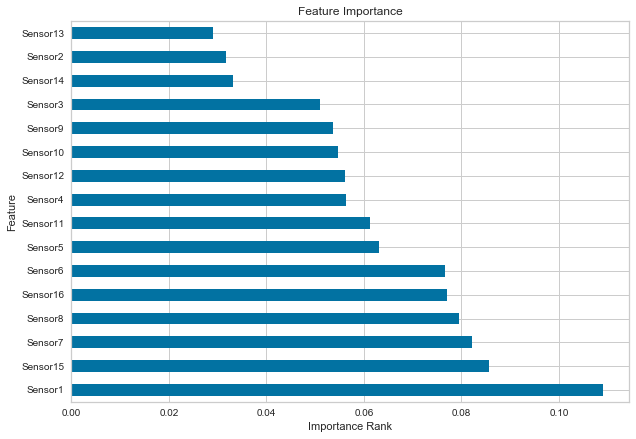

In [43]:
find_importance(X, y)

In [44]:
def evaluate_pca(X,y):
    pca = PCA().fit(X)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of components')
    plt.ylabel('Cumulative Explained Variance');
    

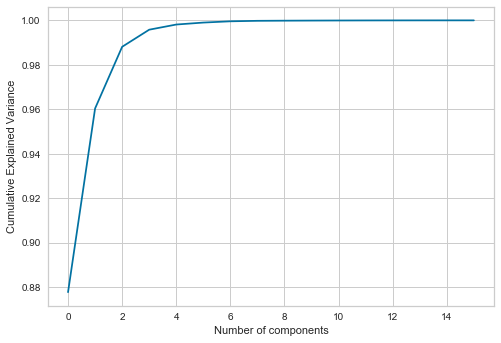

In [45]:
evaluate_pca(X,y)

In [65]:
def test_methods(X,y, reduction_algorithm, svc=False):
    start = time.time()
    result = []
    classifiers = get_classifiers()
    if svc: 
        classifiers = []
        classifiers.append({"clf": SVC(),"name":"Support Vector Machine"})
   
    for i in range(1, 17): 
        print(f"Trying with {i} components")
        print(f"____________________________________________________________________________________")
        if i != 17:
            if reduction_algorithm == "pca":
                X_r = reduce_dimension(X, type="pca", dim=i,y=None)
            if reduction_algorithm == "ica":
                X_r = reduce_dimension(X, type="ica", dim=i,y=None)
            if reduction_algorithm == "lda": 
                X_r = reduce_dimension(X, type="lda", dim=i,y=y)
            if reduction_algorithm == "lle": 
                X_r = reduce_dimension(X, type="lle", dim=i,y=None)
            if reduction_algorithm == "tsne": 
                if i < 4:
                    X_r = reduce_dimension(X, type="tsne", dim=i,y=y)
                else: 
                    print("t-SNE components should be less than 4")
                    break
        else:
            X_r = X
        X_train, X_val, X_test, y_train, y_val, y_test = split_data(X_r, y)
        clf_result =[]
        for classifier in classifiers:
            clf = classifier['clf']        
            print(f"Starting to test with {classifier['name']}")
            val_accuracy, val_mse, training_time = train_data(X_train, X_val, y_train, y_val, clf=clf)
            test_accuracy, test_mse = test_data(clf, X_test, y_test)
            clf_result.append({
                "classifier": clf,
                "classifier_name":classifier["name"],
                "reduction_algorithm":reduction_algorithm,
                "validation_accuracy": val_accuracy,
                "validation_mse": val_mse,
                "training_time": training_time,
                "test_accuracy": test_accuracy,
                "test_mse": test_mse
            })
            print("____________________________")
        print("____________________________________________________________________________________")
        result.append({"n_component":i, "observation":clf_result})
    return result

In [66]:
# from sklearn.preprocessing import minmax_scale
# from keras.layers import Input, Dense
# from keras.models import Model
# X, y = get_labels(sample2)
# sX = minmax_scale(X, axis = 0)
# ncol = X.shape[1]

# X_train, X_val, X_test, y_train, y_val, y_test = split_data(X, y)

# input_window = Input(shape=(16,))
# # "encoded" is the encoded representation of the input
# encoded = Dense(4, activation='relu')(input_window)
# # "decoded" is the lossy reconstruction of the input
# decoded = Dense(16, activation='sigmoid')(encoded)

# # this model maps an input to its reconstruction
# autoencoder = Model(input_window, decoded)

# # this model maps an input to its encoded representation
# encoder = Model(input_window, encoded)


# autoencoder.summary()
# autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
# history = autoencoder.fit(X_train, X_train,
#                 epochs=5,
#                 batch_size=16,
#                 shuffle=True,
#                 validation_data=(X_val, X_val))

# # decoded_stocks = autoencoder.predict(x_test_simple)
# # autoencoder.fit(X_train, X_train, epochs=3)

In [131]:
def select_best_models(results, without_reduction = False ):
    best_results = []
    for result in results:
        algorithm = result["algorithm"]
        max_test_acc = 0
        max_val_acc = 0
        min_val_mse = sys.maxsize
        min_test_mse = sys.maxsize
        test_acc_res = None
        val_acc_res = None
        test_mse_res = None  
        val_mse_res = None
        for comp in result["observation"]:
            if comp["n_components"] == 16 and without_reduction:
                break 
            if comp["test_accuracy"]>max_test_acc:
                max_test_acc = comp["test_accuracy"]
                test_acc_res = comp
            if comp["validation_accuracy"]>max_val_acc:
                max_val_acc = comp["validation_accuracy"]
                val_acc_res = comp
            if comp["test_mse"] < min_test_mse:
                min_test_mse = comp["test_mse"]
                test_mse_res = comp
            if comp["validation_mse"] < min_val_mse:
                min_val_mse = comp["validation_mse"]
                val_mse_res = comp
        best_results.append({ 
        "algorithm": algorithm, 
        "best_test_acc":{ 
            "accuracy":max_test_acc,
            "n_components":test_acc_res["n_components"]
        },
        "best_val_acc":{ 
            "accuracy":max_val_acc,
            "n_components":val_acc_res["n_components"]
        },
        "best_test_mse":{ 
            "mse":min_test_mse,
            "n_components":test_mse_res["n_components"]
        },
        "best_val_mse":{ 
            "mse":min_val_mse,
            "n_components":val_mse_res["n_components"]
        }            
        })
    return best_results

                

In [116]:
def  select_best_model(results):
    max_test_acc = 0
    comp = 0
    algorithm = ""
    for result in results:
        if result["best_test_acc"]["accuracy"] > max_test_acc:
            algorithm = result["algorithm"]
            max_test_acc = result["best_test_acc"]["accuracy"]
            comp = result["best_test_acc"]["n_components"]
    print(f"{algorithm} has best accuracy of {max_test_acc} at {comp} components")

In [151]:
def visualize_results(results, without_reduction=False):
    algorithm_results = []
    methods = []
    for algorithm in results[0]['observation']: 
        methods.append(algorithm["classifier_name"])
        
    for i, algorithm in enumerate(methods):
        classifier_results = []
        for result in results:
            classifier_results.append({
                "n_components":result["n_component"],
                "classifier": result['observation'][i]["classifier"],
                "classifier_name":result['observation'][i]["classifier_name"],
                "reduction_algorithm":result['observation'][i]["reduction_algorithm"],
                "validation_accuracy": result['observation'][i]["validation_accuracy"],
                "validation_mse":result['observation'][i]['validation_mse'],
                "training_time": result['observation'][i]['training_time'],
                "test_accuracy": result['observation'][i]['test_accuracy'],
                "test_mse":result["observation"][i]['test_mse']
            })
        algorithm_results.append({"algorithm":algorithm,'observation':classifier_results})
    
    for result in algorithm_results: 
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(20,10))
        fig.suptitle(result['algorithm'])
        components = []
        val_accuracies = []
        test_accuracies = []
        val_mse = []
        test_mse = [] 
        times = []
        for res in result['observation']:
            components.append(res['n_components'])
            val_accuracies.append(res['validation_accuracy'] * 100)
            test_accuracies.append(res['test_accuracy'] * 100)
            val_mse.append(res["validation_mse"])
            test_mse.append(res['test_mse'])
            times.append(res["training_time"])
        ax1.plot(components, test_accuracies, label="Test")
        ax1.plot(components, val_accuracies, label="Validation")
        ax1.set_xlabel('Number of components')
        ax1.set_ylabel('Accuracy')
        ax1.set_title('Accuracy / N-components')
        ax1.legend()
      
        ax2.plot(components, test_mse, label="Test")
        ax2.plot(components, val_mse, label="Validation")
        ax2.set_xlabel('Number of components')
        ax2.set_ylabel('MSE')
        ax2.set_title('MSE / N-components')
        ax2.legend()
        
        ax3.plot(components, times, label="Time")
        ax3.set_xlabel('Number of components')
        ax3.set_ylabel('Time')
        ax3.set_title('time / N-components')
        ax3.legend()
              
    plt.show()
    return select_best_models(algorithm_results, without_reduction)   

In [86]:
 _,small_sample = sample_data(data,0.001)

In [87]:
Xs,ys = get_labels(small_sample)

In [77]:
pca_results= test_methods(X,y,"pca")

Trying with 1 components
____________________________________________________________________________________
Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 51.67805167805167
MSE for  classifier  = 1.0971190971190972
Operation completed in 0.008977413177490234 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 60.11286011286011
MSE for  classifier  = 0.8927828927828928
Operation completed in 0.15961241722106934 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 60.201960201960205
MSE for  classifier  = 0.9031779031779031
Operation completed in 0.13318824768066406 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 60.26136026136027
MSE for  classifier  = 0.8915948915948916
Operation completed in 0.16356301307678223 seconds
____________________________
Starting to test with K

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 55.242055242055244
MSE for  classifier  = 1.0582120582120582
Operation completed in 0.015622138977050781 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 75.49747549747549
MSE for  classifier  = 0.6237006237006237
Operation completed in 0.2857475280761719 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 75.67567567567568
MSE for  classifier  = 0.613008613008613
Operation completed in 0.21582531929016113 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 75.58657558657559
MSE for  classifier  = 0.6242946242946243
Operation completed in 0.13021302223205566 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 75.67567567567568
MSE for  classifier  = 0.6097416097416097

Accuracy Score for classifier = 87.22898722898724
MSE for  classifier  = 0.37125037125037125
Operation completed in 0.18939924240112305 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.1992871992872
MSE for  classifier  = 0.37392337392337394
Operation completed in 0.1496419906616211 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.79328779328779
MSE for  classifier  = 0.3552123552123552
Operation completed in 0.15164566040039062 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.73388773388774
MSE for  classifier  = 0.36026136026136024
Operation completed in 0.1513383388519287 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 88.14968814968816
MSE for  classifier  = 0.3439263439263439
Operation completed in 0.16279220581054688 s

Accuracy Score for classifier = 88.44668844668846
MSE for  classifier  = 0.3359073359073359
Operation completed in 0.18393635749816895 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 88.44668844668846
MSE for  classifier  = 0.3365013365013365
Operation completed in 0.16275882720947266 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 88.98128898128898
MSE for  classifier  = 0.3171963171963172
Operation completed in 0.19302797317504883 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 89.21888921888922
MSE for  classifier  = 0.31363231363231364
Operation completed in 0.17109060287475586 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 89.57528957528957
MSE for  classifier  = 0.30323730323730325
Operation completed in 0.16128969192504883

Accuracy Score for classifier = 88.68428868428867
MSE for  classifier  = 0.33442233442233443
Operation completed in 0.25144529342651367 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 88.8921888921889
MSE for  classifier  = 0.32967032967032966
Operation completed in 0.22398638725280762 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 89.07038907038907
MSE for  classifier  = 0.3258093258093258
Operation completed in 0.22559762001037598 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 89.45648945648945
MSE for  classifier  = 0.31333531333531334
Operation completed in 0.2146916389465332 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 89.78318978318978
MSE for  classifier  = 0.3047223047223047
Operation completed in 0.2117912769317627 s

Accuracy Score for classifier = 91.62459162459162
MSE for  classifier  = 0.23373923373923375
Operation completed in 0.2646617889404297 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.8918918918919
MSE for  classifier  = 0.2275022275022275
Operation completed in 0.24388456344604492 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 92.04039204039204
MSE for  classifier  = 0.22067122067122066
Operation completed in 0.25119876861572266 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.42649242649243
MSE for  classifier  = 0.21235521235521235
Operation completed in 0.24578022956848145 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.84229284229284
MSE for  classifier  = 0.19750519750519752
Operation completed in 0.23938822746276855

Accuracy Score for classifier = 91.59489159489159
MSE for  classifier  = 0.23670923670923671
Operation completed in 0.2690913677215576 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 92.01069201069201
MSE for  classifier  = 0.22453222453222454
Operation completed in 0.27024316787719727 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 92.27799227799228
MSE for  classifier  = 0.21562221562221562
Operation completed in 0.25377774238586426 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.51559251559252
MSE for  classifier  = 0.20968220968220969
Operation completed in 0.26050877571105957 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.84229284229284
MSE for  classifier  = 0.19750519750519752
Operation completed in 0.253126859664917

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 91.59489159489159
MSE for  classifier  = 0.2384912384912385
Operation completed in 0.3048536777496338 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 92.04039204039204
MSE for  classifier  = 0.22156222156222155
Operation completed in 0.266599178314209 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 92.39679239679239
MSE for  classifier  = 0.21176121176121177
Operation completed in 0.2742617130279541 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.6046926046926
MSE for  classifier  = 0.2087912087912088
Operation completed in 0.27198219299316406 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.87199287199287
MSE for  classif

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 91.41669141669142
MSE for  classifier  = 0.24205524205524206
Operation completed in 0.3035738468170166 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.65429165429165
MSE for  classifier  = 0.2361152361152361
Operation completed in 0.29199934005737305 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 92.01069201069201
MSE for  classifier  = 0.2272052272052272
Operation completed in 0.2843801975250244 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.36709236709237
MSE for  classifier  = 0.2191862191862192
Operation completed in 0.27471423149108887 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.75319275319275
MSE for  class

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 91.32759132759134
MSE for  classifier  = 0.24383724383724384
Operation completed in 0.3395540714263916 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.77309177309178
MSE for  classifier  = 0.23225423225423225
Operation completed in 0.30298686027526855 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.95129195129195
MSE for  classifier  = 0.2277992277992278
Operation completed in 0.32617783546447754 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.48589248589248
MSE for  classifier  = 0.21294921294921296
Operation completed in 0.3128190040588379 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.78289278289277
MSE for  cla

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 91.38699138699138
MSE for  classifier  = 0.24235224235224234
Operation completed in 0.35408663749694824 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.8027918027918
MSE for  classifier  = 0.23106623106623106
Operation completed in 0.3129117488861084 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.8918918918919
MSE for  classifier  = 0.23106623106623106
Operation completed in 0.3210623264312744 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.1888921888922
MSE for  classifier  = 0.22126522126522127
Operation completed in 0.332979679107666 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.57499257499258
MSE for  classif

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 91.41669141669142
MSE for  classifier  = 0.24205524205524206
Operation completed in 0.679898738861084 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.71369171369172
MSE for  classifier  = 0.23463023463023464
Operation completed in 0.6785962581634521 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.8918918918919
MSE for  classifier  = 0.23017523017523017
Operation completed in 0.6834933757781982 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.1888921888922
MSE for  classifier  = 0.2203742203742204
Operation completed in 0.6780226230621338 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.51559251559252
MSE for  classifi

Accuracy Score for classifier = 91.35729135729136
MSE for  classifier  = 0.24443124443124442
Operation completed in 0.7352535724639893 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.74339174339174
MSE for  classifier  = 0.23344223344223344
Operation completed in 0.7070109844207764 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.95129195129195
MSE for  classifier  = 0.2277992277992278
Operation completed in 0.7058603763580322 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.1888921888922
MSE for  classifier  = 0.22185922185922186
Operation completed in 0.6881313323974609 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.6046926046926
MSE for  classifier  = 0.2087912087912088
Operation completed in 0.6831364631652832 secon

Accuracy Score for classifier = 91.38699138699138
MSE for  classifier  = 0.24324324324324326
Operation completed in 0.7475519180297852 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.74339174339174
MSE for  classifier  = 0.23344223344223344
Operation completed in 0.7239389419555664 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.95129195129195
MSE for  classifier  = 0.2277992277992278
Operation completed in 0.7407925128936768 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.1888921888922
MSE for  classifier  = 0.22275022275022274
Operation completed in 0.7145748138427734 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.63439263439264
MSE for  classifier  = 0.2076032076032076
Operation completed in 0.9956326484680176 seco

Accuracy Score for classifier = 91.41669141669142
MSE for  classifier  = 0.24205524205524206
Operation completed in 0.4316377639770508 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 91.8027918027918
MSE for  classifier  = 0.23195723195723195
Operation completed in 0.41908717155456543 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 91.98099198099197
MSE for  classifier  = 0.2275022275022275
Operation completed in 0.42214107513427734 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 92.1888921888922
MSE for  classifier  = 0.22275022275022274
Operation completed in 0.40564441680908203 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 92.63439263439264
MSE for  classifier  = 0.2076032076032076
Operation completed in 0.4220848083496094 se

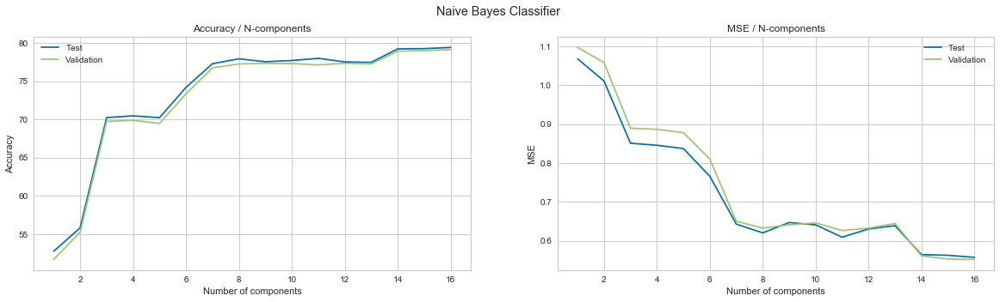

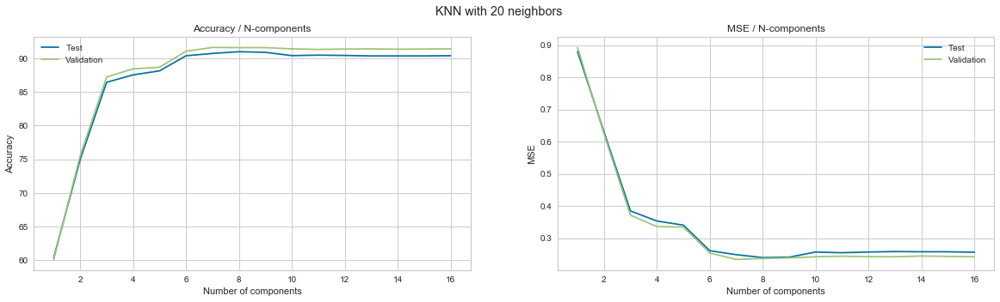

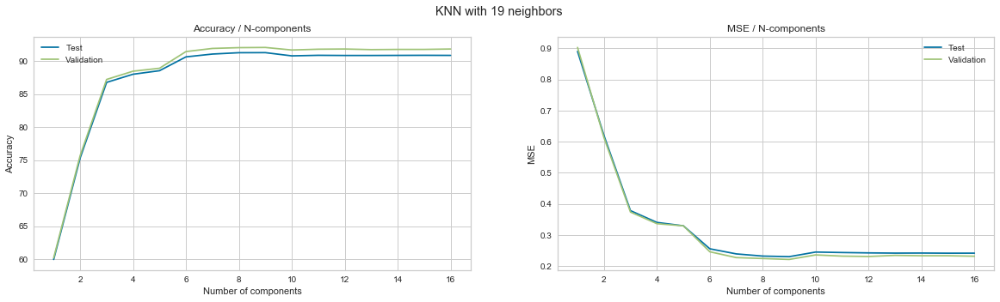

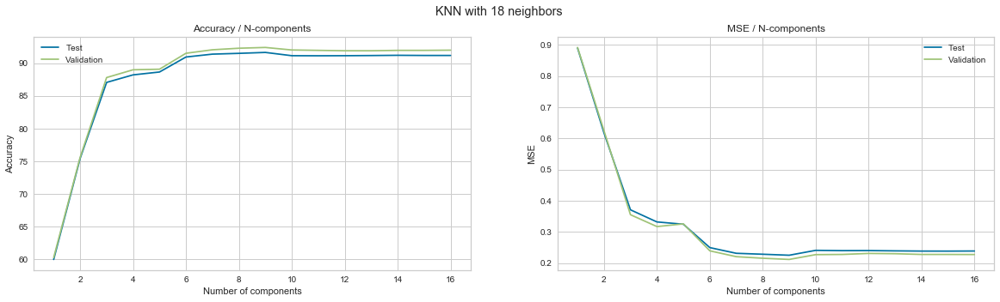

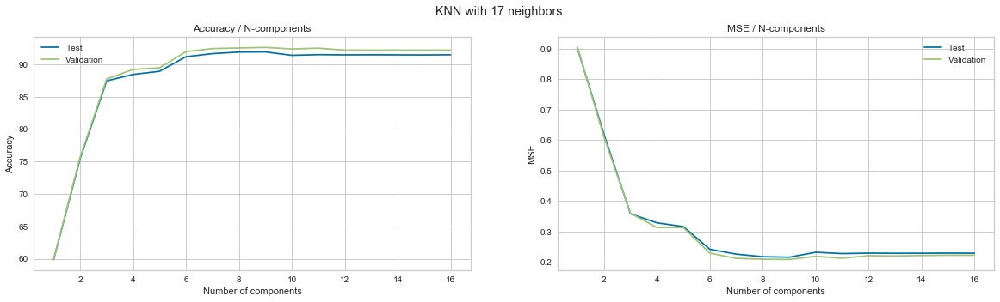

...

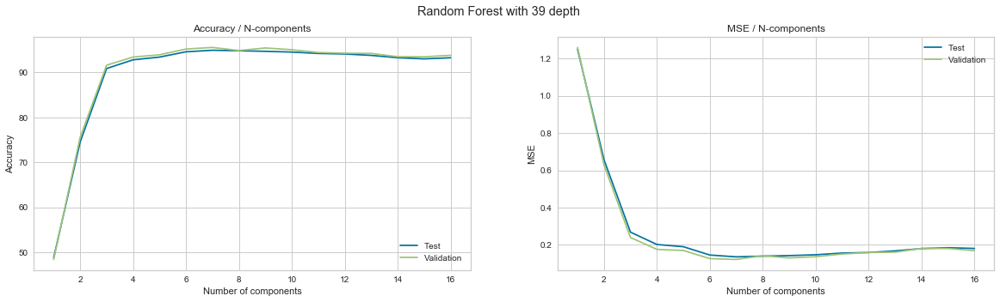

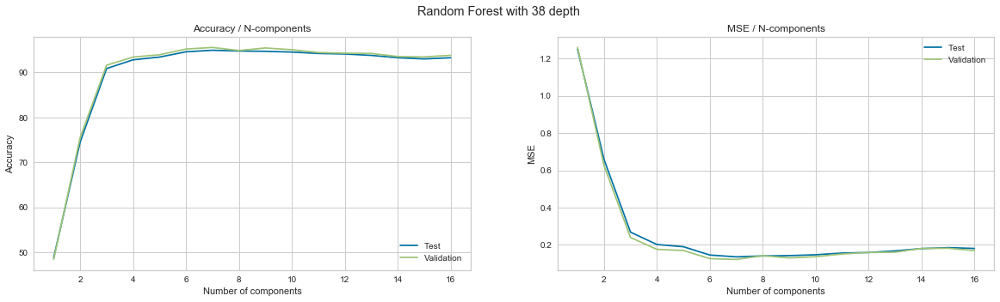

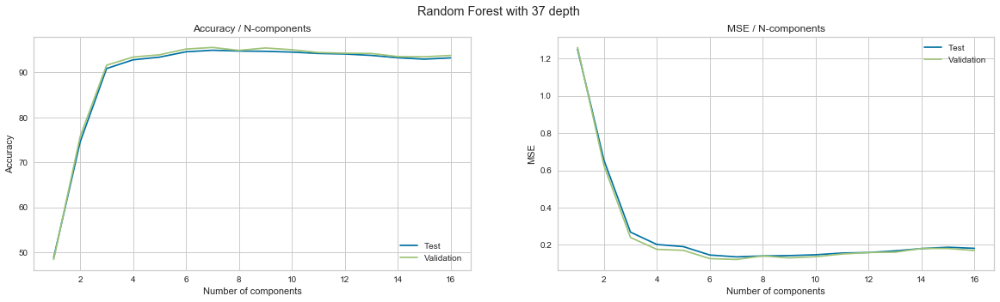

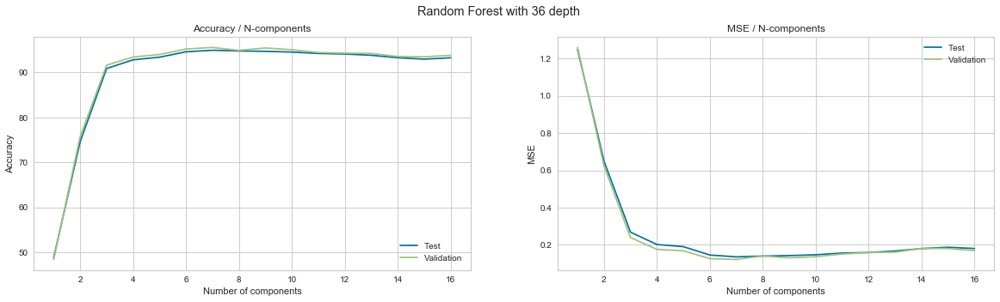

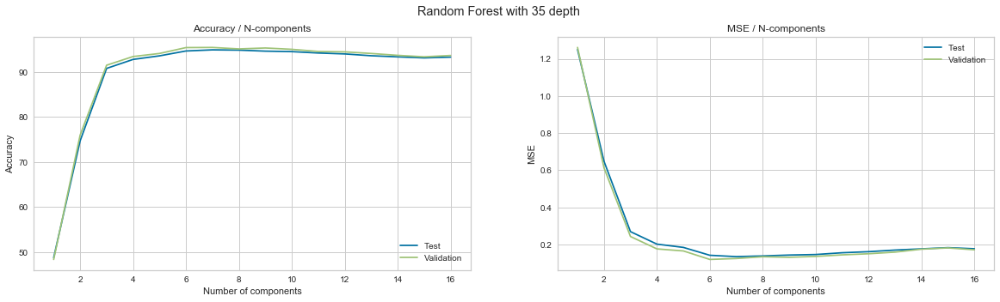

In [138]:
best_pca_results = visualize_results(pca_results)

In [137]:
best_pca_results

[{'algorithm': 'Naive Bayes Classifier',
  'best_test_acc': {'accuracy': 0.7925626707853154, 'n_components': 15},
  'best_val_acc': {'accuracy': 0.7900207900207901, 'n_components': 15},
  'best_test_mse': {'mse': 0.5627895924913865, 'n_components': 15},
  'best_val_mse': {'mse': 0.5533115533115534, 'n_components': 15}},
 {'algorithm': 'KNN with 20 neighbors',
  'best_test_acc': {'accuracy': 0.9099441606273019, 'n_components': 8},
  'best_val_acc': {'accuracy': 0.9162459162459162, 'n_components': 7},
  'best_test_mse': {'mse': 0.23951526672211002, 'n_components': 8},
  'best_val_mse': {'mse': 0.23373923373923375, 'n_components': 7}},
 {'algorithm': 'KNN with 19 neighbors',
  'best_test_acc': {'accuracy': 0.9125579184982773, 'n_components': 9},
  'best_val_acc': {'accuracy': 0.9204039204039204, 'n_components': 9},
  'best_test_mse': {'mse': 0.23048592134964951, 'n_components': 9},
  'best_val_mse': {'mse': 0.22156222156222155, 'n_components': 9}},
 {'algorithm': 'KNN with 18 neighbors',


In [117]:
select_best_model(best_pca_results)

KNN with 1 neighbors has best accuracy of 0.9574670310086729 at 8 components


Trying with 1 components
____________________________________________________________________________________
Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 51.67805167805167
MSE for  classifier  = 1.0971190971190972
Operation completed in 0.015621185302734375 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 60.11286011286011
MSE for  classifier  = 0.8927828927828928
Operation completed in 0.19001150131225586 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 60.201960201960205
MSE for  classifier  = 0.9031779031779031
Operation completed in 0.13902497291564941 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 60.26136026136027
MSE for  classifier  = 0.8915948915948916
Operation completed in 0.13592290878295898 seconds
____________________________
Starting to test with K

Accuracy Score for classifier = 75.2004752004752
MSE for  classifier  = 0.6337986337986338
Operation completed in 0.18002867698669434 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 75.73507573507572
MSE for  classifier  = 0.6186516186516187
Operation completed in 0.13558602333068848 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 75.46777546777547
MSE for  classifier  = 0.6281556281556282
Operation completed in 0.13129663467407227 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 75.37867537867538
MSE for  classifier  = 0.623997623997624
Operation completed in 0.1401386260986328 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 75.49747549747549
MSE for  classifier  = 0.6272646272646273
Operation completed in 0.12240266799926758 seco

Accuracy Score for classifier = 87.7041877041877
MSE for  classifier  = 0.34778734778734777
Operation completed in 0.1848435401916504 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.85268785268785
MSE for  classifier  = 0.3385803385803386
Operation completed in 0.1556994915008545 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 88.03088803088804
MSE for  classifier  = 0.3359073359073359
Operation completed in 0.14135360717773438 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 88.20908820908821
MSE for  classifier  = 0.33145233145233144
Operation completed in 0.15831899642944336 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 88.74368874368874
MSE for  classifier  = 0.3195723195723196
Operation completed in 0.1411898136138916 sec

Accuracy Score for classifier = 88.5060885060885
MSE for  classifier  = 0.31897831897831896
Operation completed in 0.20021390914916992 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 88.92188892188892
MSE for  classifier  = 0.30561330561330563
Operation completed in 0.17438054084777832 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 89.3970893970894
MSE for  classifier  = 0.29224829224829224
Operation completed in 0.16343355178833008 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 89.51588951588951
MSE for  classifier  = 0.29076329076329077
Operation completed in 0.17147183418273926 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 90.02079002079002
MSE for  classifier  = 0.275022275022275
Operation completed in 0.16834187507629395 

____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 86.54588654588655
MSE for  classifier  = 0.3875853875853876
Operation completed in 0.2355480194091797 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 86.99138699138699
MSE for  classifier  = 0.3751113751113751
Operation completed in 0.2254483699798584 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 86.96168696168695
MSE for  classifier  = 0.3783783783783784
Operation completed in 0.20863962173461914 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.13988713988714
MSE for  classifier  = 0.3745173745173745
Operation completed in 0.20514702796936035 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.7041877041877
MSE for  classif

Accuracy Score for classifier = 89.78318978318978
MSE for  classifier  = 0.28185328185328185
Operation completed in 0.2673020362854004 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 90.08019008019008
MSE for  classifier  = 0.27442827442827444
Operation completed in 0.24972319602966309 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 89.99108999108999
MSE for  classifier  = 0.27264627264627267
Operation completed in 0.25435328483581543 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 90.02079002079002
MSE for  classifier  = 0.27145827145827145
Operation completed in 0.2579958438873291 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 90.34749034749035
MSE for  classifier  = 0.26640926640926643
Operation completed in 0.2549390792846679

Accuracy Score for classifier = 90.43659043659044
MSE for  classifier  = 0.2678942678942679
Operation completed in 0.3304891586303711 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 90.67419067419067
MSE for  classifier  = 0.26373626373626374
Operation completed in 0.2990703582763672 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 90.82269082269082
MSE for  classifier  = 0.25868725868725867
Operation completed in 0.30423808097839355 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 90.91179091179092
MSE for  classifier  = 0.25334125334125335
Operation completed in 0.29314637184143066 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 91.11969111969111
MSE for  classifier  = 0.24413424413424414
Operation completed in 0.30216383934020996

Accuracy Score for classifier = 90.31779031779031
MSE for  classifier  = 0.2681912681912682
Operation completed in 0.44893693923950195 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 90.46629046629047
MSE for  classifier  = 0.2675972675972676
Operation completed in 0.4024829864501953 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 90.73359073359073
MSE for  classifier  = 0.26046926046926044
Operation completed in 0.3931009769439697 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 90.88209088209088
MSE for  classifier  = 0.258984258984259
Operation completed in 0.38393592834472656 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 91.17909117909117
MSE for  classifier  = 0.2471042471042471
Operation completed in 0.3763387203216553 seco

Accuracy Score for classifier = 89.54558954558955
MSE for  classifier  = 0.29284229284229285
Operation completed in 0.5536689758300781 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 89.57528957528957
MSE for  classifier  = 0.29165429165429163
Operation completed in 0.5230953693389893 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 89.78318978318978
MSE for  classifier  = 0.286011286011286
Operation completed in 0.5035114288330078 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 89.75348975348976
MSE for  classifier  = 0.2836352836352836
Operation completed in 0.5136187076568604 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 89.84258984258983
MSE for  classifier  = 0.28007128007128007
Operation completed in 0.4935777187347412 seco

Accuracy Score for classifier = 87.91208791208791
MSE for  classifier  = 0.3376893376893377
Operation completed in 1.0347938537597656 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.79328779328779
MSE for  classifier  = 0.3388773388773389
Operation completed in 0.8383703231811523 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 88.001188001188
MSE for  classifier  = 0.33412533412533413
Operation completed in 0.8371217250823975 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.88238788238787
MSE for  classifier  = 0.3353133353133353
Operation completed in 0.8668463230133057 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 88.20908820908821
MSE for  classifier  = 0.3284823284823285
Operation completed in 0.7968001365661621 seconds

Accuracy Score for classifier = 87.25868725868726
MSE for  classifier  = 0.35135135135135137
Operation completed in 1.5477819442749023 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.2883872883873
MSE for  classifier  = 0.3483813483813484
Operation completed in 1.6505849361419678 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.52598752598753
MSE for  classifier  = 0.34065934065934067
Operation completed in 1.2193589210510254 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.5853875853876
MSE for  classifier  = 0.340956340956341
Operation completed in 1.2056896686553955 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.79328779328779
MSE for  classifier  = 0.33442233442233443
Operation completed in 1.1416680812835693 second

Accuracy Score for classifier = 86.99138699138699
MSE for  classifier  = 0.3673893673893674
Operation completed in 1.7152819633483887 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.1992871992872
MSE for  classifier  = 0.36085536085536085
Operation completed in 1.6388249397277832 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.40718740718741
MSE for  classifier  = 0.3516483516483517
Operation completed in 1.5865159034729004 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.43688743688743
MSE for  classifier  = 0.35046035046035046
Operation completed in 1.5888795852661133 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.61508761508762
MSE for  classifier  = 0.34511434511434513
Operation completed in 1.5430479049682617 seco

Accuracy Score for classifier = 87.25868725868726
MSE for  classifier  = 0.35847935847935847
Operation completed in 2.1258182525634766 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.34778734778735
MSE for  classifier  = 0.3575883575883576
Operation completed in 2.1663832664489746 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.4962874962875
MSE for  classifier  = 0.35343035343035345
Operation completed in 2.0610010623931885 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.4962874962875
MSE for  classifier  = 0.35343035343035345
Operation completed in 2.0728344917297363 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.46658746658747
MSE for  classifier  = 0.35550935550935553
Operation completed in 2.1011013984680176 seco

Accuracy Score for classifier = 87.7041877041877
MSE for  classifier  = 0.34244134244134244
Operation completed in 2.719334363937378 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.7041877041877
MSE for  classifier  = 0.34333234333234336
Operation completed in 2.600581645965576 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.73388773388774
MSE for  classifier  = 0.3439263439263439
Operation completed in 2.63592529296875 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.61508761508762
MSE for  classifier  = 0.34333234333234336
Operation completed in 2.5181243419647217 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.46658746658747
MSE for  classifier  = 0.3519453519453519
Operation completed in 2.5884344577789307 seconds
_

Accuracy Score for classifier = 87.05078705078705
MSE for  classifier  = 0.34986634986634985
Operation completed in 3.436077833175659 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 87.02108702108701
MSE for  classifier  = 0.35283635283635284
Operation completed in 3.4174487590789795 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 87.31808731808732
MSE for  classifier  = 0.3445203445203445
Operation completed in 3.736314296722412 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.31808731808732
MSE for  classifier  = 0.3463023463023463
Operation completed in 3.352649688720703 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 87.43688743688743
MSE for  classifier  = 0.346005346005346
Operation completed in 3.2586452960968018 seconds


Accuracy Score for classifier = 86.72408672408672
MSE for  classifier  = 0.362043362043362
Operation completed in 4.2784435749053955 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 86.6943866943867
MSE for  classifier  = 0.3623403623403623
Operation completed in 4.130471229553223 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 86.78348678348678
MSE for  classifier  = 0.3587763587763588
Operation completed in 4.273979902267456 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 87.13988713988714
MSE for  classifier  = 0.3436293436293436
Operation completed in 4.087322950363159 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 86.9022869022869
MSE for  classifier  = 0.35224235224235223
Operation completed in 4.078774929046631 seconds
____

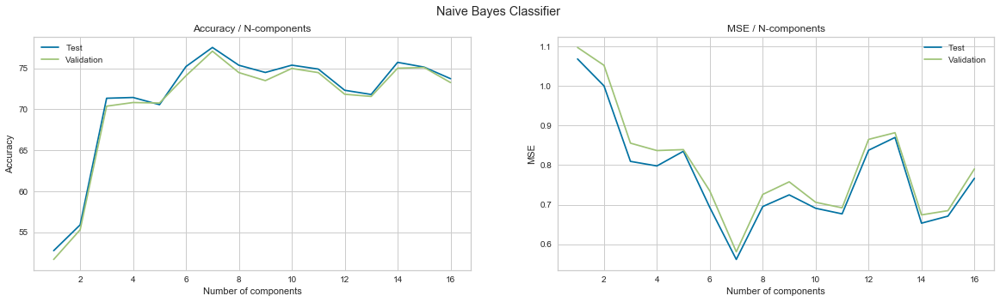

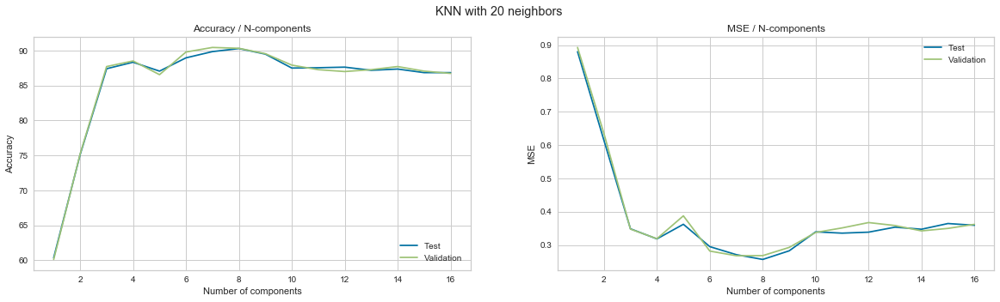

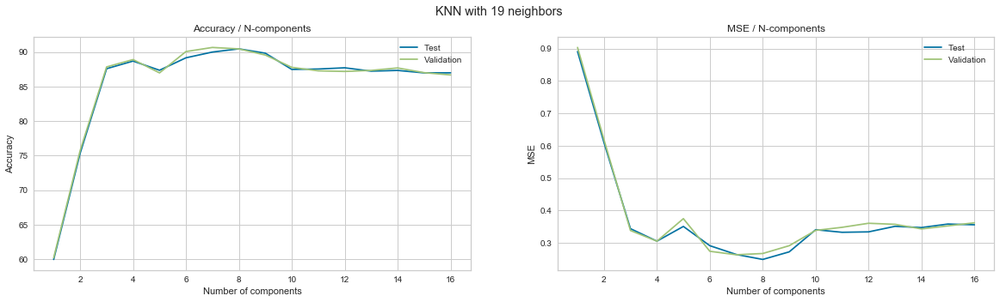

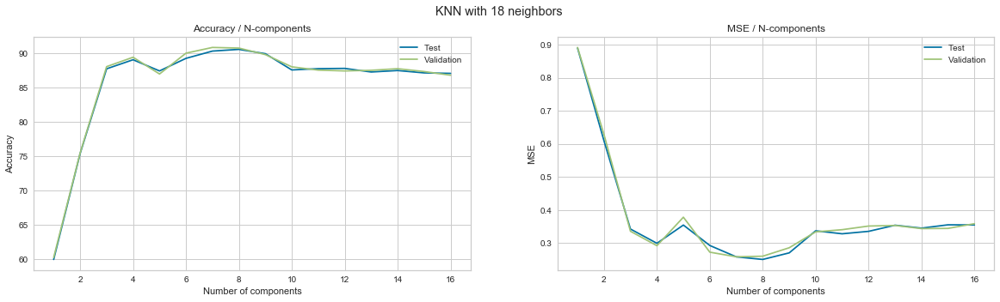

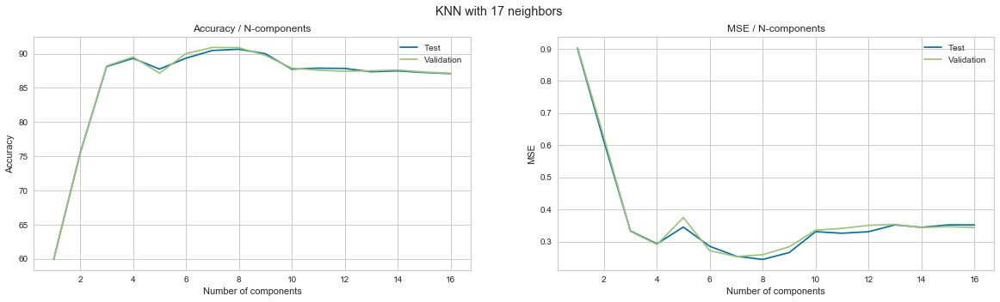

...

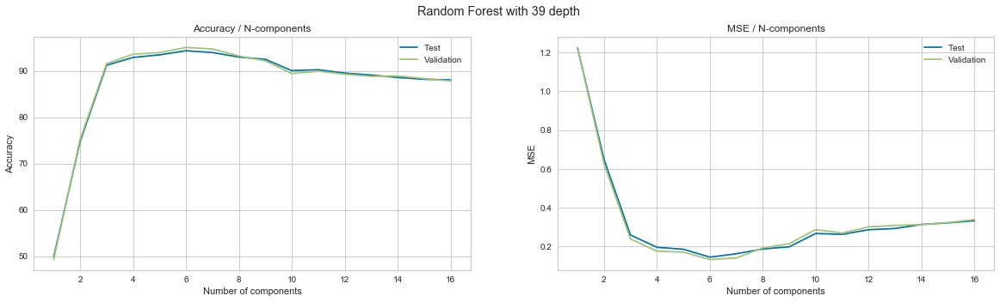

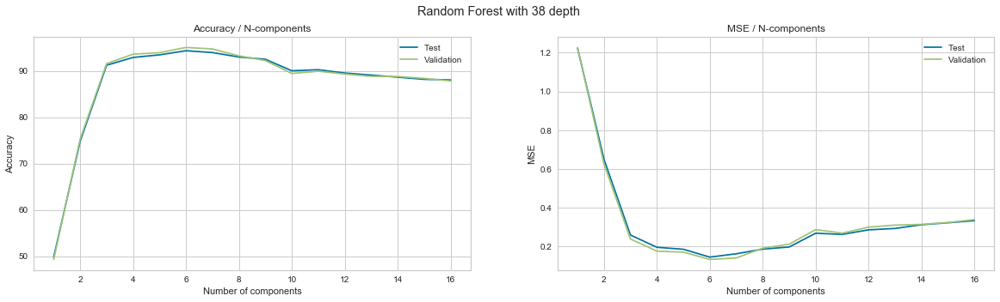

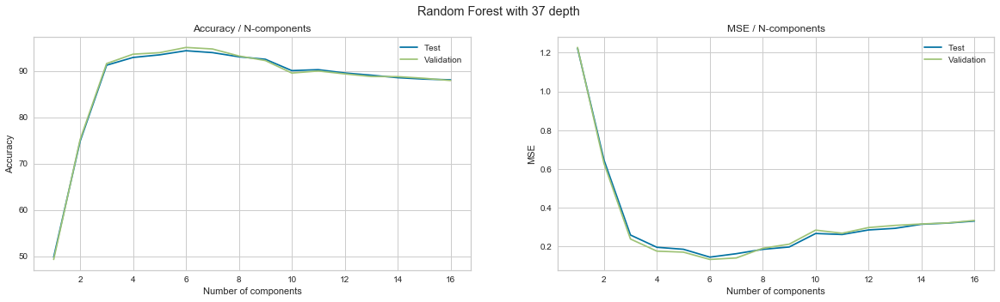

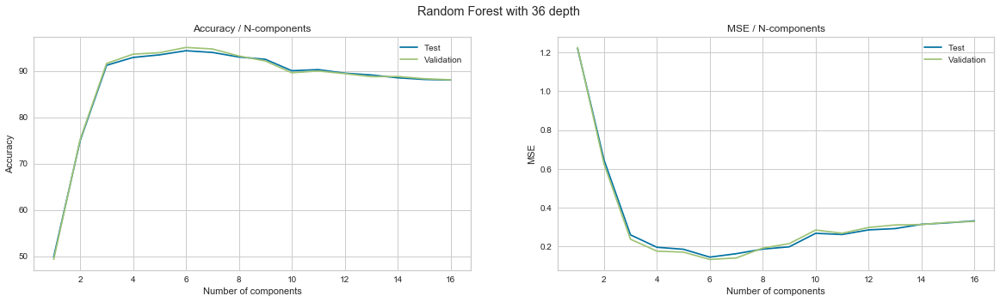

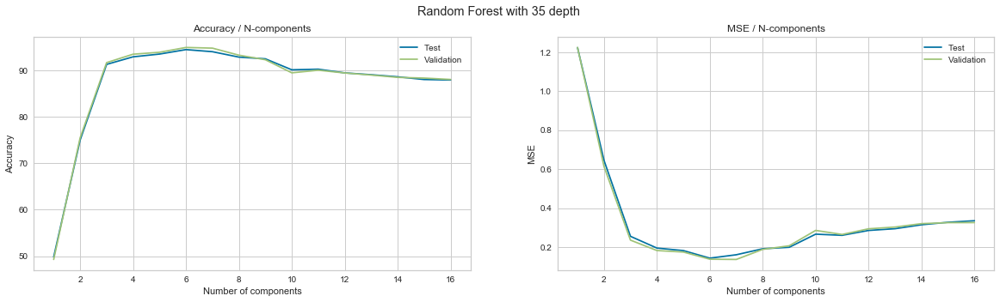

In [79]:
ica_results= test_methods(X,y,"ica")

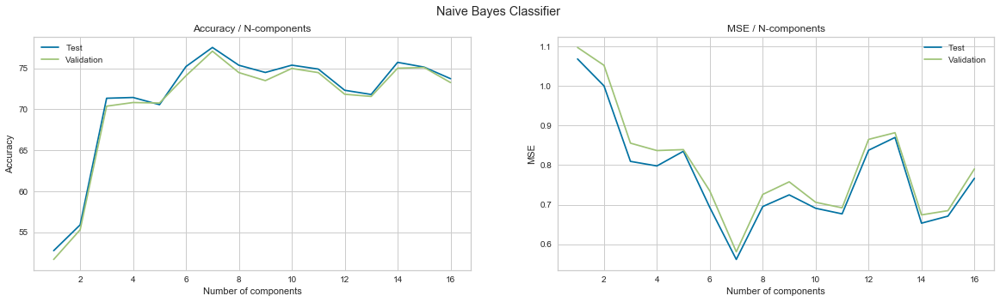

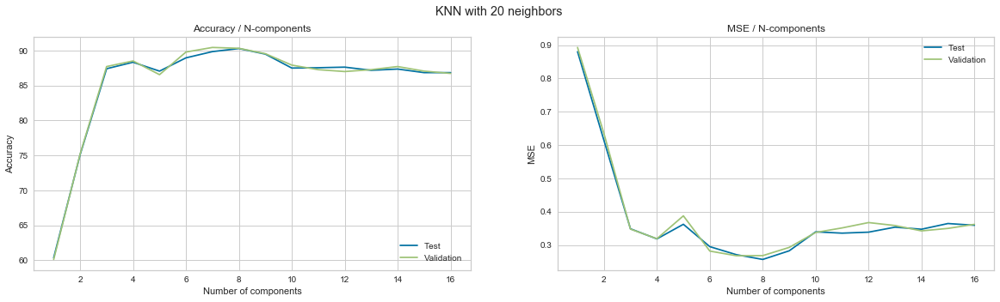

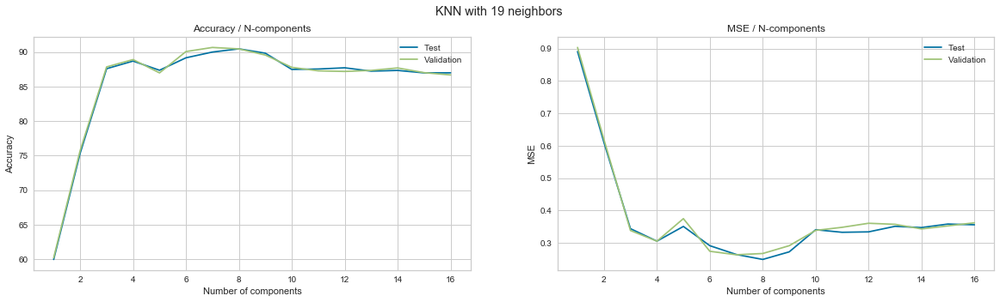

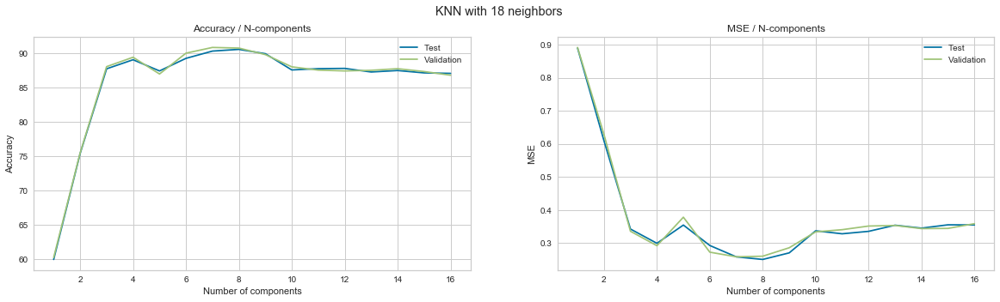

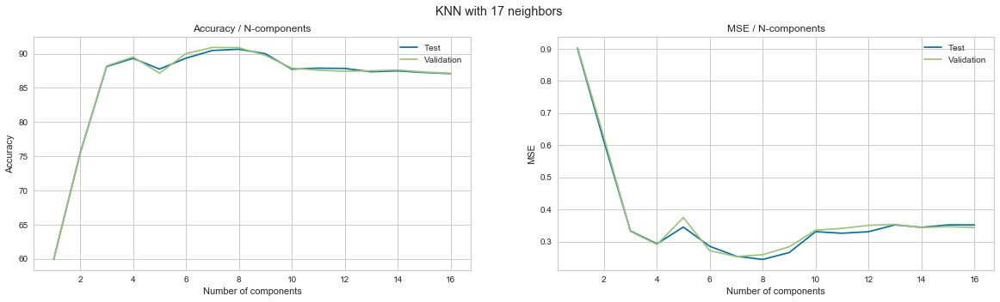

...

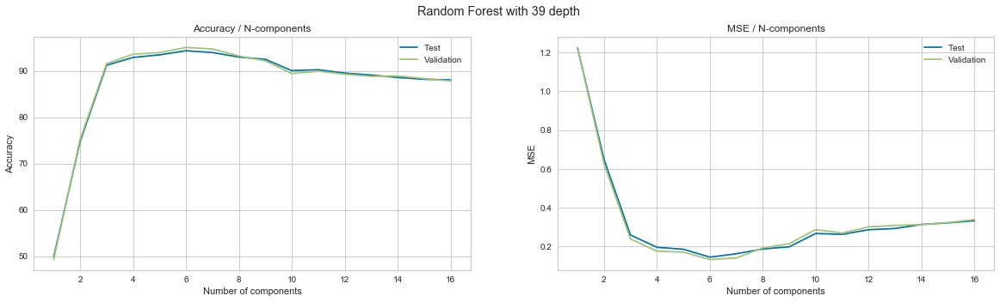

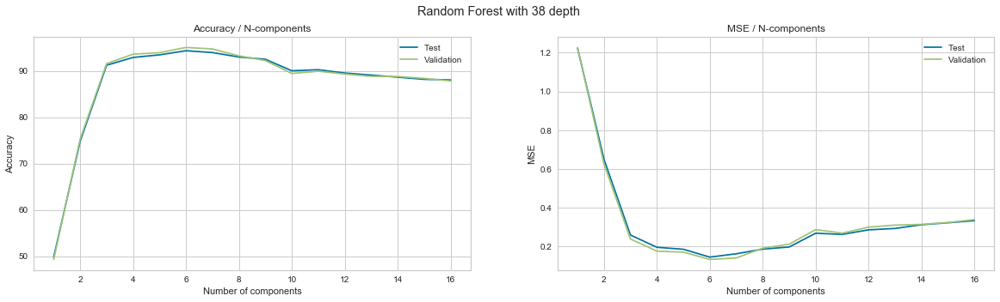

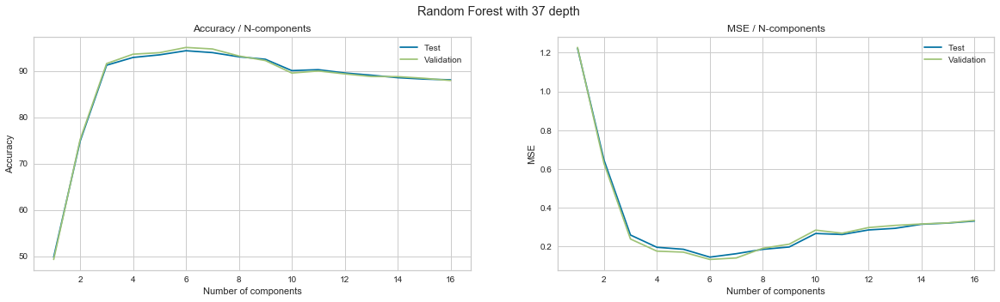

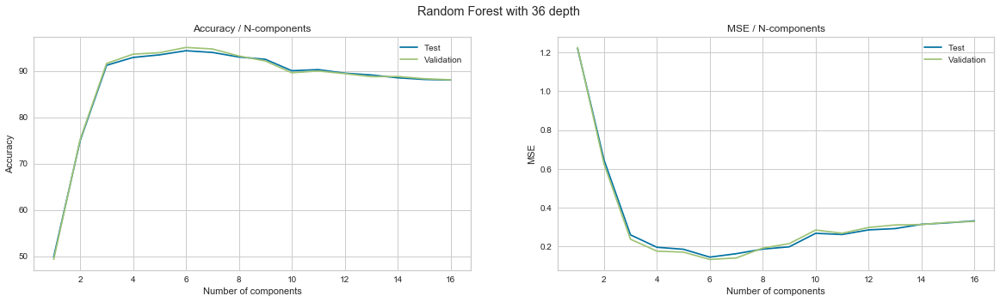

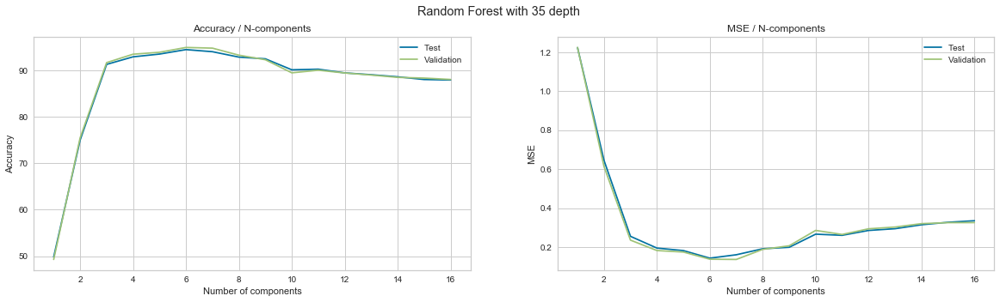

In [118]:
best_ica_results = visualize_results(ica_results)

In [119]:
best_ica_results

[{'algorithm': 'Naive Bayes Classifier',
  'best_test_acc': {'accuracy': 0.7755732446239753, 'n_components': 7},
  'best_val_acc': {'accuracy': 0.771012771012771, 'n_components': 7},
  'best_test_mse': {'mse': 0.5616015207318522, 'n_components': 7},
  'best_val_mse': {'mse': 0.5809325809325809, 'n_components': 7}},
 {'algorithm': 'KNN with 20 neighbors',
  'best_test_acc': {'accuracy': 0.9028157300700962, 'n_components': 8},
  'best_val_acc': {'accuracy': 0.9043659043659044, 'n_components': 7},
  'best_test_mse': {'mse': 0.256742307235357, 'n_components': 8},
  'best_val_mse': {'mse': 0.2678942678942679, 'n_components': 7}},
 {'algorithm': 'KNN with 19 neighbors',
  'best_test_acc': {'accuracy': 0.9047166448853511, 'n_components': 8},
  'best_val_acc': {'accuracy': 0.9067419067419067, 'n_components': 7},
  'best_test_mse': {'mse': 0.24925745515029107, 'n_components': 8},
  'best_val_mse': {'mse': 0.26373626373626374, 'n_components': 7}},
 {'algorithm': 'KNN with 18 neighbors',
  'best_

In [120]:
select_best_model(best_ica_results)

Random Forest with 35 depth has best accuracy of 0.9448734703576096 at 6 components


Trying with 1 components
____________________________________________________________________________________
Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 46.88427299703264
MSE for  classifier  = 1.5074183976261128
Operation completed in 0.010063886642456055 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 79.22848664688428
MSE for  classifier  = 0.5816023738872403
Operation completed in 0.030113935470581055 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 79.22848664688428
MSE for  classifier  = 0.5905044510385756
Operation completed in 0.020049333572387695 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 79.52522255192879
MSE for  classifier  = 0.56973293768546
Operation completed in 0.028191089630126953 seconds
____________________________
Starting to test with K

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 70.32640949554896
MSE for  classifier  = 0.887240356083086
Operation completed in 0.0 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 79.22848664688428
MSE for  classifier  = 0.599406528189911
Operation completed in 0.0300900936126709 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 79.52522255192879
MSE for  classifier  = 0.5964391691394659
Operation completed in 0.0280911922454834 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 79.82195845697329
MSE for  classifier  = 0.5845697329376854
Operation completed in 0.020070314407348633 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 79.82195845697329
MSE for  classifier  = 0.5845697329376854
Operation complete

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 68.24925816023739
MSE for  classifier  = 1.089020771513353
Operation completed in 0.010041952133178711 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 79.22848664688428
MSE for  classifier  = 0.6172106824925816
Operation completed in 0.03211355209350586 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 79.52522255192879
MSE for  classifier  = 0.6053412462908012
Operation completed in 0.020049095153808594 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 80.1186943620178
MSE for  classifier  = 0.5816023738872403
Operation completed in 0.01812005043029785 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 80.41543026706232
MSE for  classifier  = 0.56973293768546
O

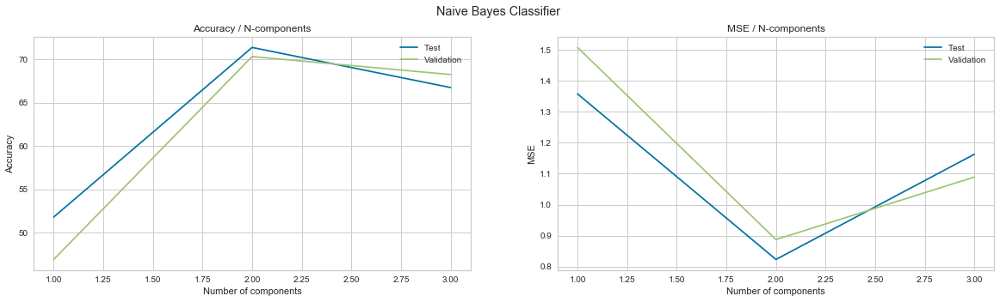

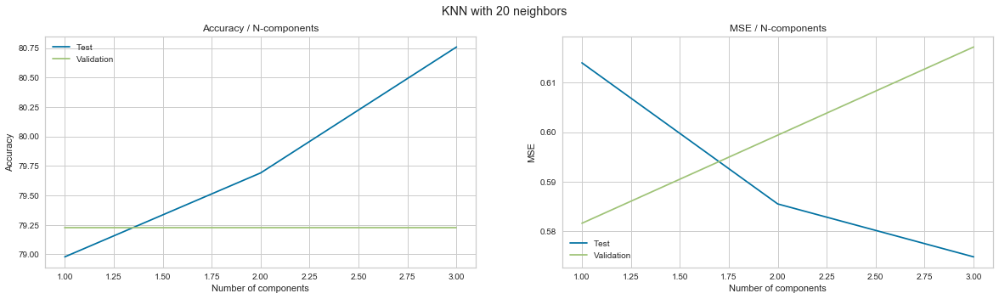

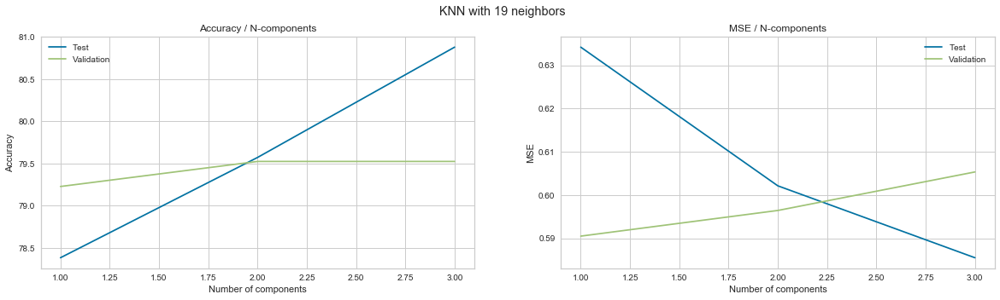

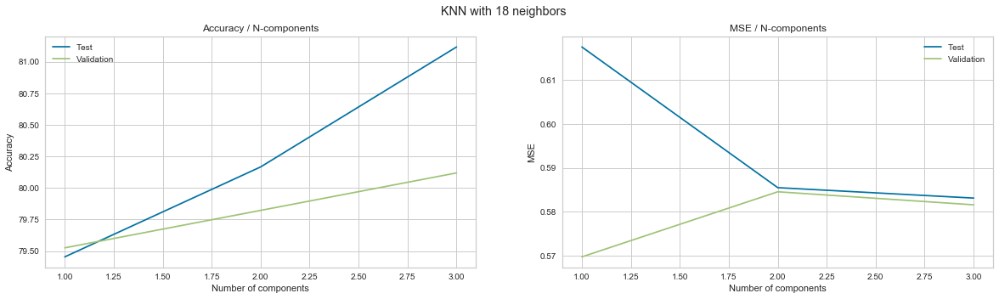

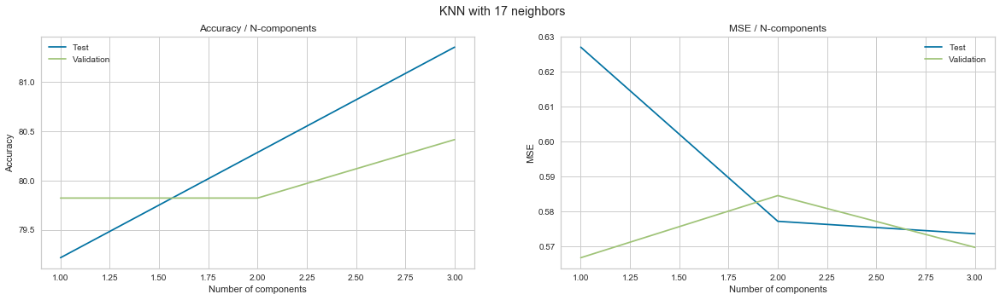

...

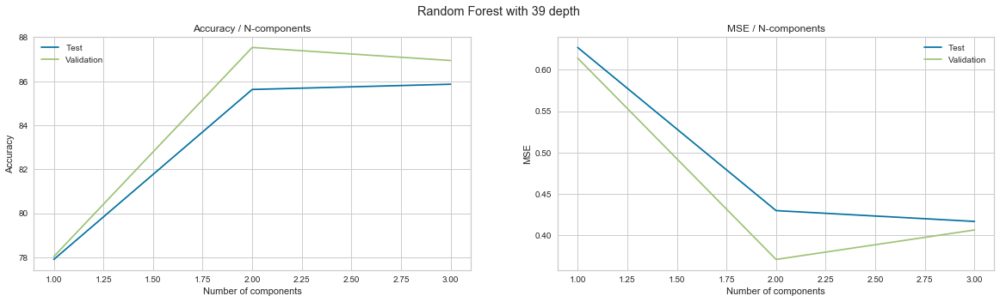

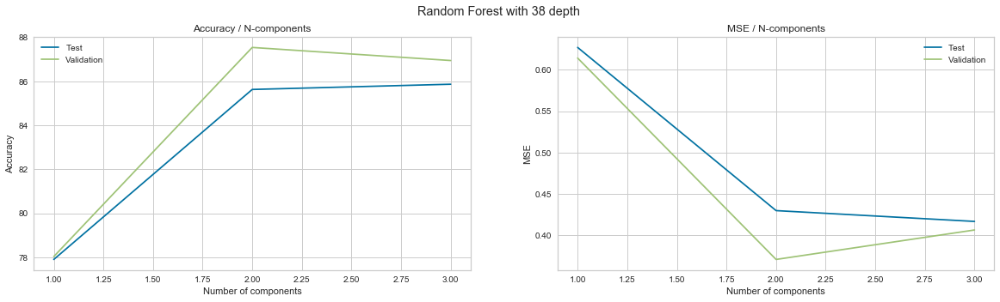

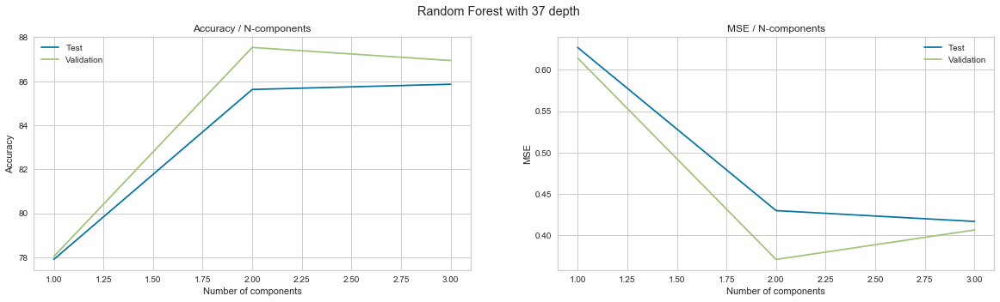

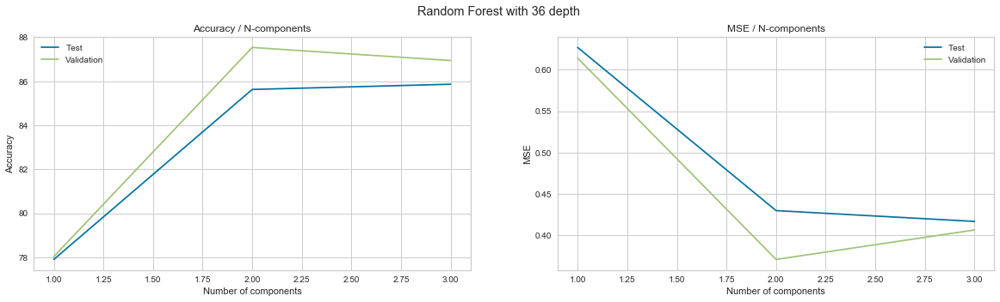

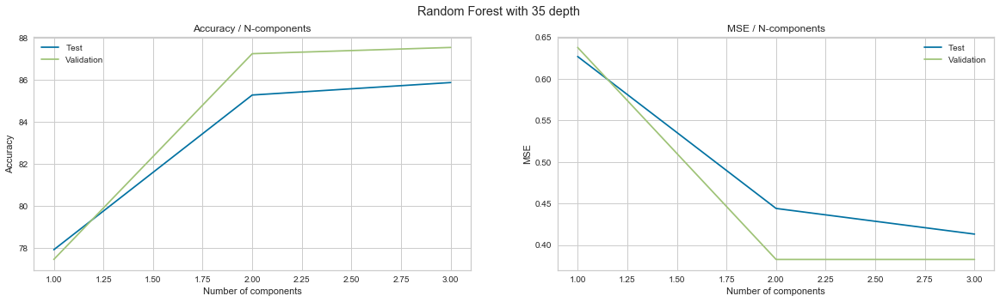

In [80]:
tsne_results= test_methods(Xs,ys,"tsne")

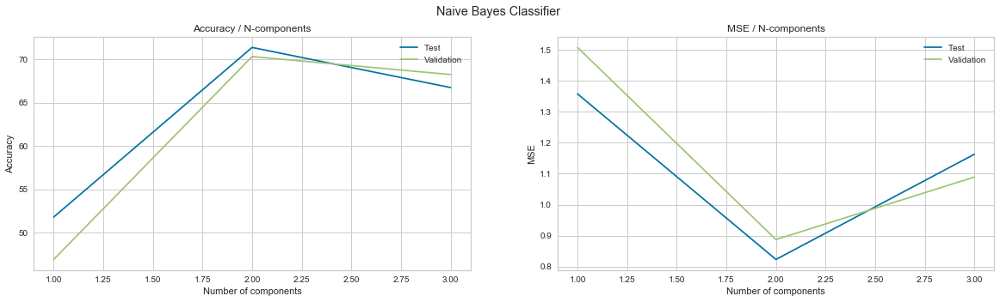

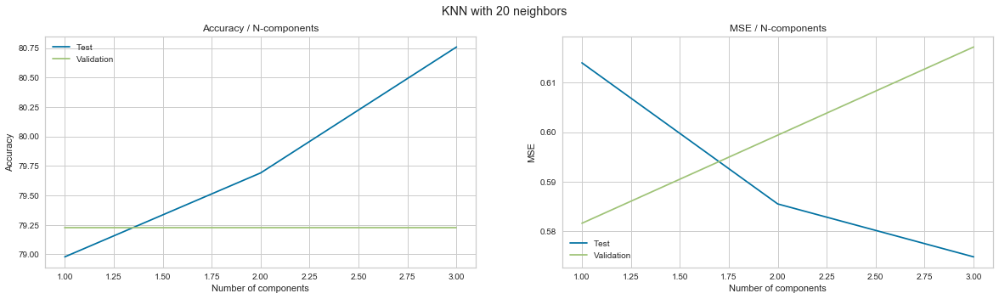

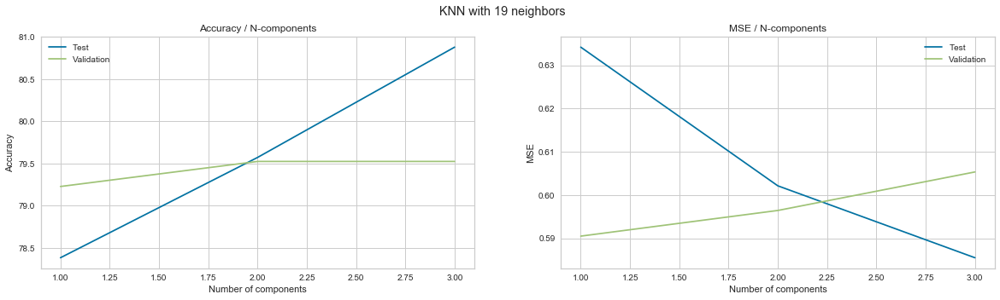

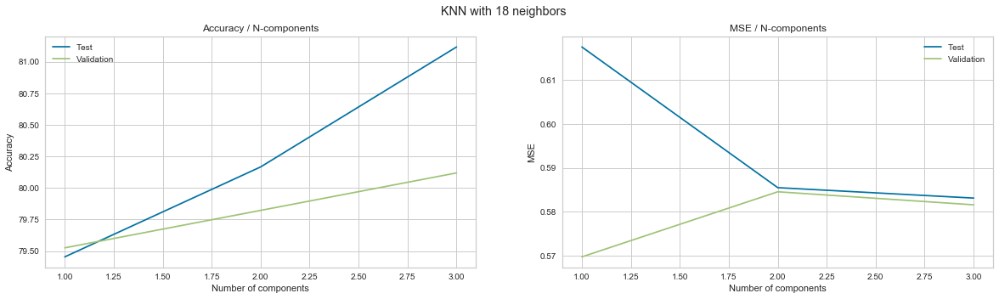

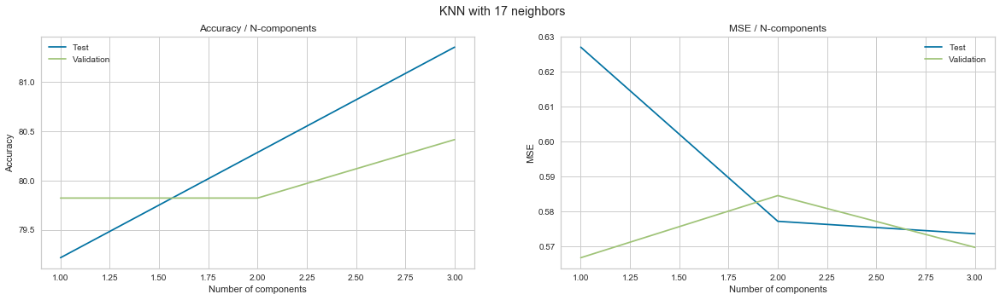

...

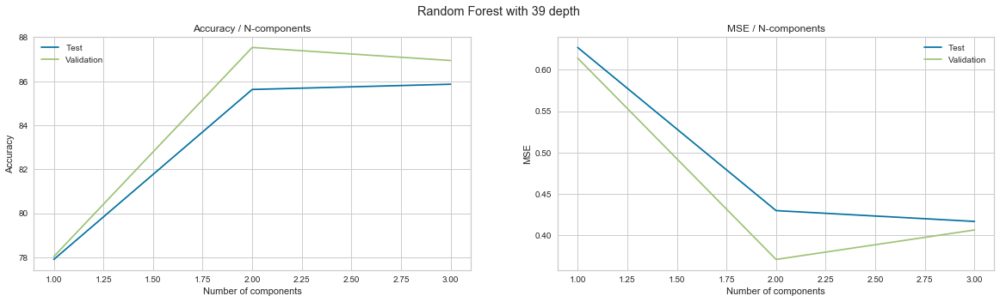

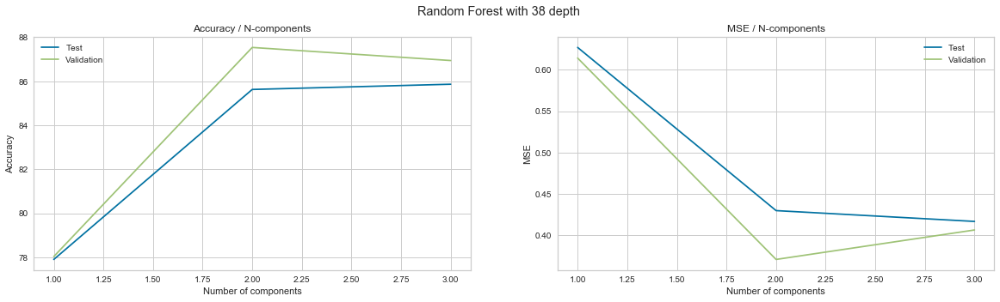

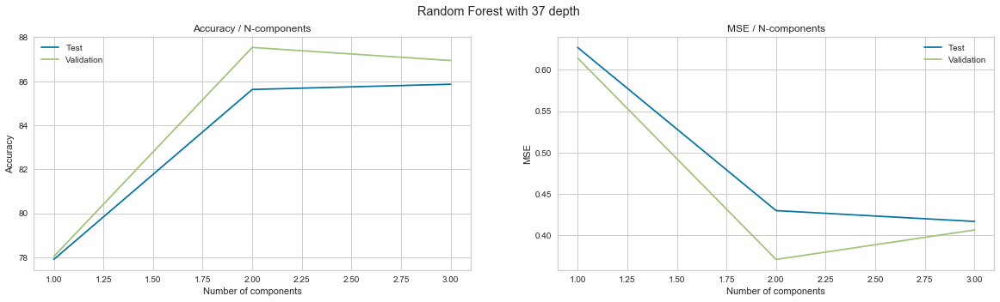

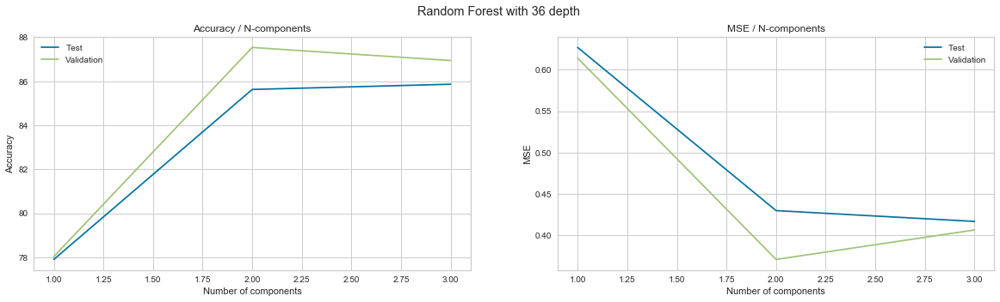

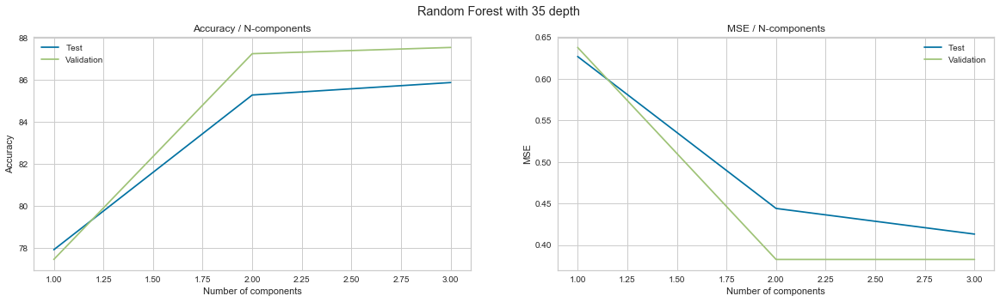

In [121]:
best_tsne_results = visualize_results(tsne_results)

In [123]:
best_tsne_results

[{'algorithm': 'Naive Bayes Classifier',
  'best_test_acc': {'accuracy': 0.7137767220902613, 'n_components': 2},
  'best_val_acc': {'accuracy': 0.7032640949554896, 'n_components': 2},
  'best_test_mse': {'mse': 0.8230403800475059, 'n_components': 2},
  'best_val_mse': {'mse': 0.887240356083086, 'n_components': 2}},
 {'algorithm': 'KNN with 20 neighbors',
  'best_test_acc': {'accuracy': 0.8076009501187649, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.7922848664688428, 'n_components': 1},
  'best_test_mse': {'mse': 0.5748218527315915, 'n_components': 3},
  'best_val_mse': {'mse': 0.5816023738872403, 'n_components': 1}},
 {'algorithm': 'KNN with 19 neighbors',
  'best_test_acc': {'accuracy': 0.8087885985748219, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.7952522255192879, 'n_components': 2},
  'best_test_mse': {'mse': 0.5855106888361045, 'n_components': 3},
  'best_val_mse': {'mse': 0.5905044510385756, 'n_components': 1}},
 {'algorithm': 'KNN with 18 neighbors',
  'best_t

In [124]:
select_best_model(best_tsne_results)

KNN with 1 neighbors has best accuracy of 0.8681710213776722 at 3 components


In [149]:
lle_results = test_methods(Xs,ys,'lle')

Trying with 1 components
____________________________________________________________________________________
Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 33.531157270029674
MSE for  classifier  = 2.483679525222552
Operation completed in 0.004188060760498047 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 65.28189910979229
MSE for  classifier  = 1.231454005934718
Operation completed in 0.031821489334106445 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 67.35905044510386
MSE for  classifier  = 1.1661721068249258
Operation completed in 0.019695758819580078 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 67.06231454005935
MSE for  classifier  = 1.2106824925816024
Operation completed in 0.006870269775390625 seconds
____________________________
Starting to test with 

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 32.34421364985163
MSE for  classifier  = 2.7833827893175074
Operation completed in 0.000988006591796875 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 68.84272997032642
MSE for  classifier  = 0.9436201780415431
Operation completed in 0.022576570510864258 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 68.5459940652819
MSE for  classifier  = 0.9554896142433235
Operation completed in 0.005403280258178711 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 68.84272997032642
MSE for  classifier  = 0.9584569732937686
Operation completed in 0.020775318145751953 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 68.84272997032642
MSE for  classifier  = 0.9821958456973

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 34.124629080118694
MSE for  classifier  = 2.5459940652818993
Operation completed in 0.012898683547973633 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 69.43620178041543
MSE for  classifier  = 0.8219584569732937
Operation completed in 0.02551412582397461 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 69.43620178041543
MSE for  classifier  = 0.8219584569732937
Operation completed in 0.0196990966796875 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 69.43620178041543
MSE for  classifier  = 0.8130563798219584
Operation completed in 0.01721978187561035 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 69.73293768545994
MSE for  classifier  = 0.810089020771513

KeyboardInterrupt: 

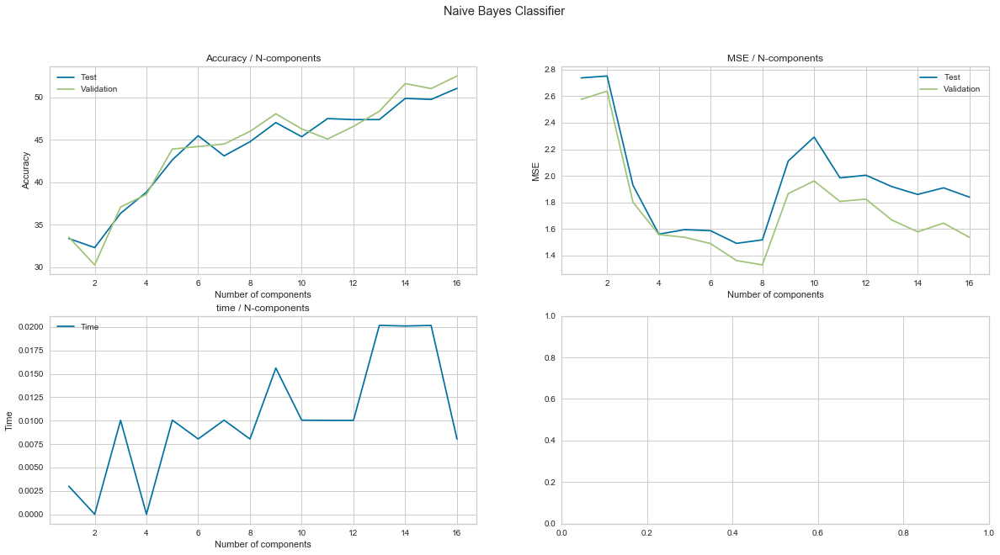

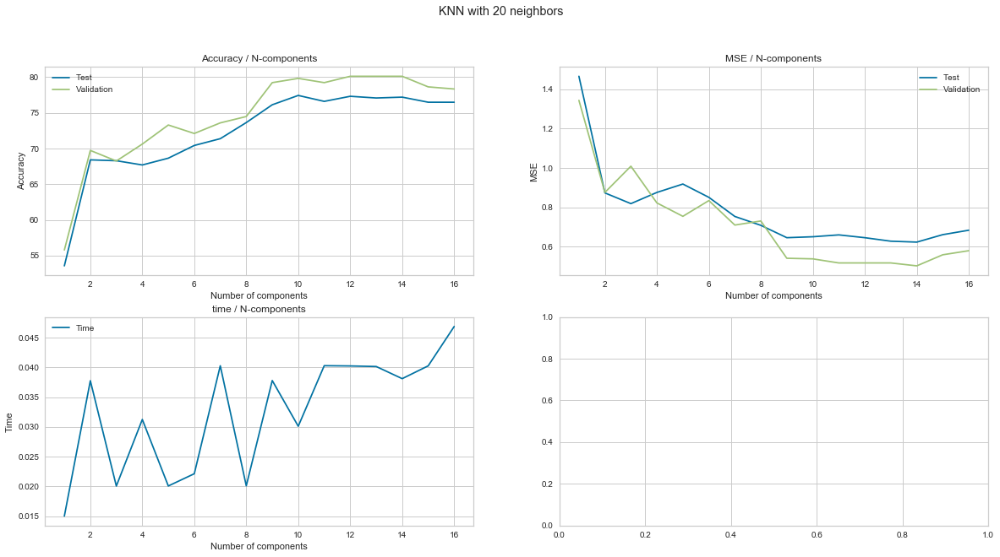

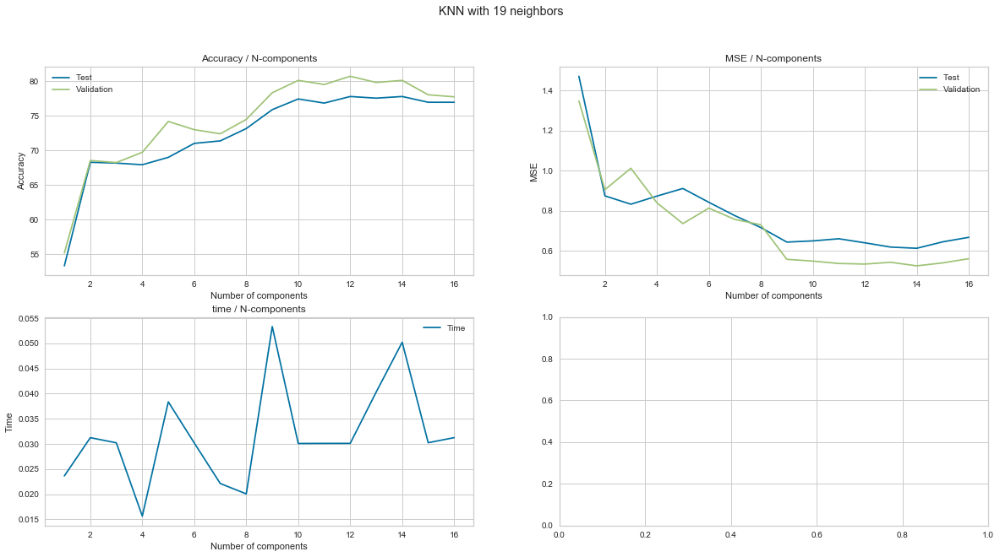

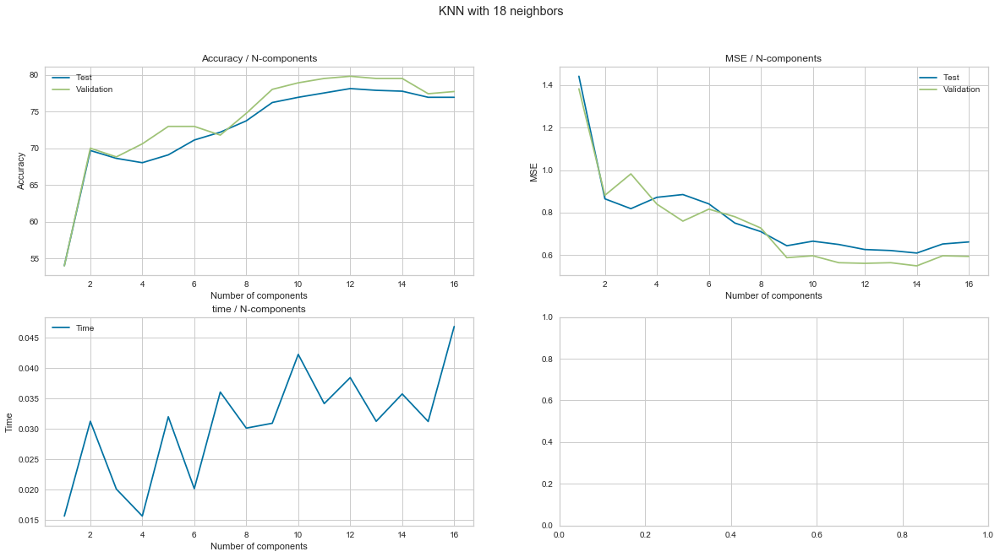

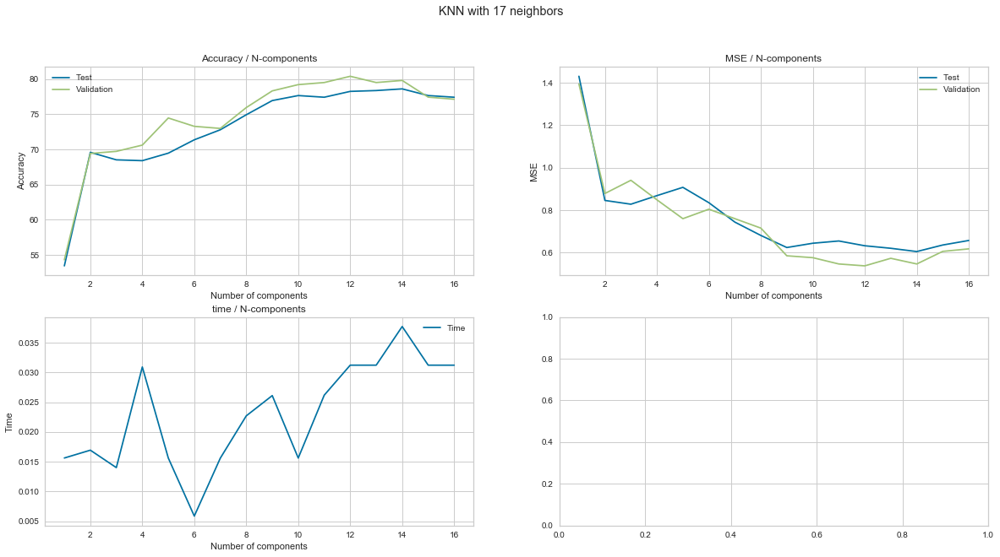

...

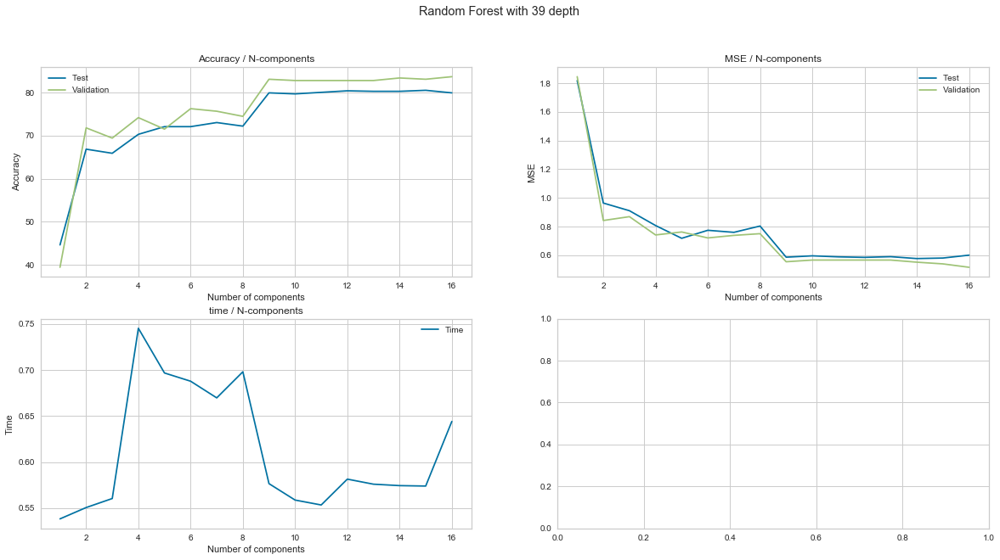

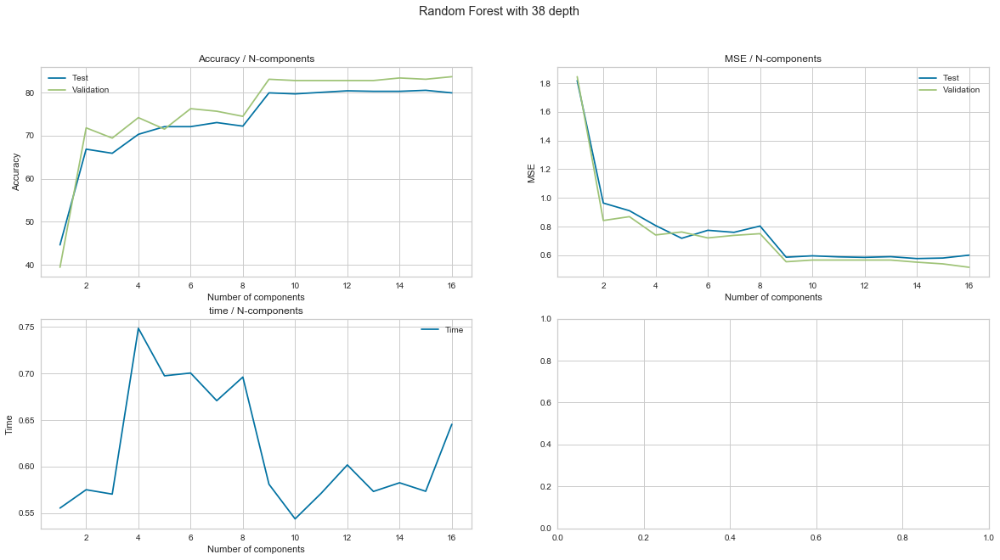

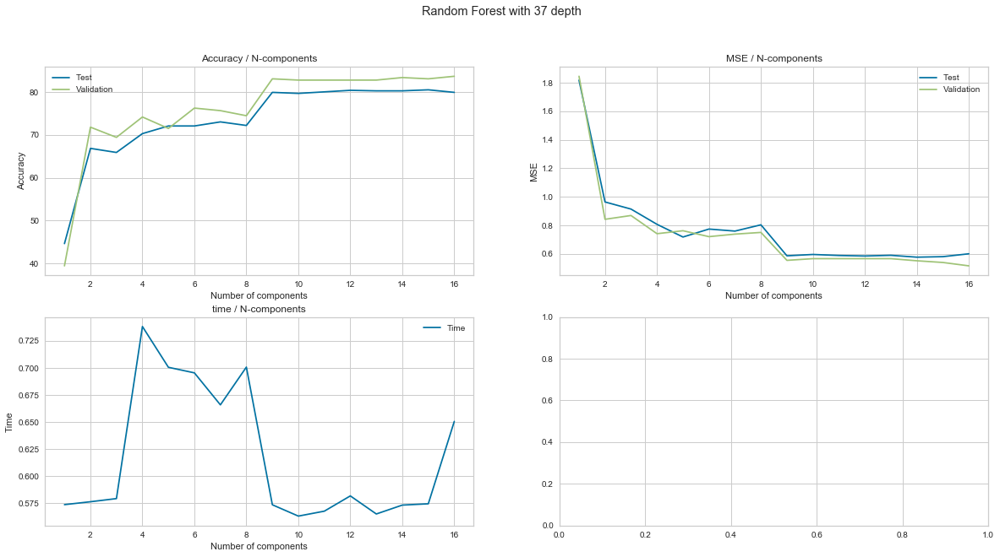

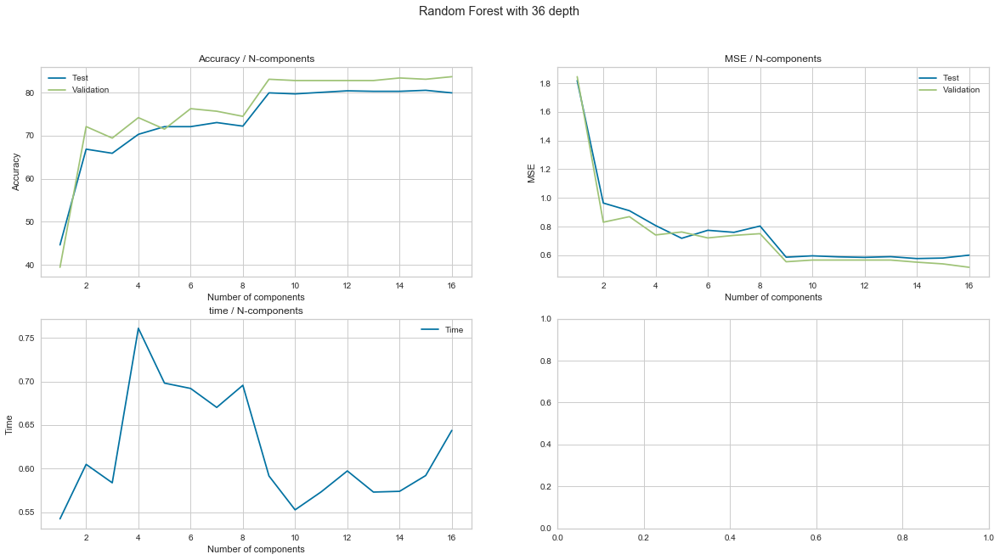

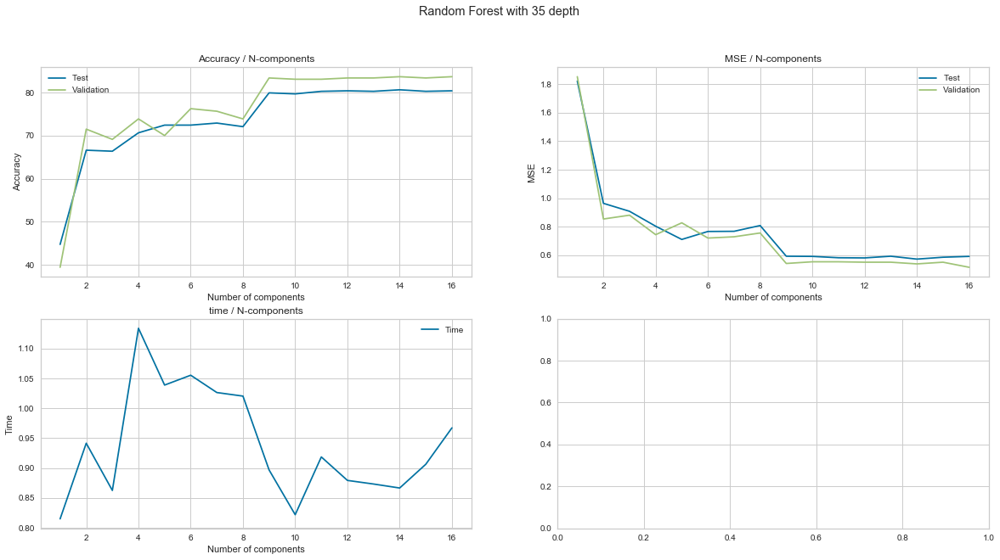

In [155]:
best_lle_results = visualize_results(lle_results, without_reduction=True)

In [126]:
best_lle_results

[{'algorithm': 'Naive Bayes Classifier',
  'best_test_acc': {'accuracy': 0.5106888361045131, 'n_components': 16},
  'best_val_acc': {'accuracy': 0.5252225519287834, 'n_components': 16},
  'best_test_mse': {'mse': 1.491686460807601, 'n_components': 7},
  'best_val_mse': {'mse': 1.3293768545994065, 'n_components': 8}},
 {'algorithm': 'KNN with 20 neighbors',
  'best_test_acc': {'accuracy': 0.7743467933491687, 'n_components': 10},
  'best_val_acc': {'accuracy': 0.8011869436201781, 'n_components': 12},
  'best_test_mse': {'mse': 0.6223277909738717, 'n_components': 14},
  'best_val_mse': {'mse': 0.5014836795252225, 'n_components': 14}},
 {'algorithm': 'KNN with 19 neighbors',
  'best_test_acc': {'accuracy': 0.7779097387173397, 'n_components': 12},
  'best_val_acc': {'accuracy': 0.8071216617210683, 'n_components': 12},
  'best_test_mse': {'mse': 0.6128266033254157, 'n_components': 14},
  'best_val_mse': {'mse': 0.5252225519287834, 'n_components': 14}},
 {'algorithm': 'KNN with 18 neighbors',

In [156]:
select_best_model(best_lle_results)

KNN with 3 neighbors has best accuracy of 0.831353919239905 at 15 components


Trying with 1 components
____________________________________________________________________________________
Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 62.99376299376299
MSE for  classifier  = 1.391149391149391
Operation completed in 0.008007526397705078 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 67.83486783486784
MSE for  classifier  = 1.144045144045144
Operation completed in 0.19746971130371094 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 67.80516780516781
MSE for  classifier  = 1.146124146124146
Operation completed in 0.16772890090942383 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 67.5972675972676
MSE for  classifier  = 1.155925155925156
Operation completed in 0.15912127494812012 seconds
____________________________
Starting to test with KNN wit

Starting to test with Naive Bayes Classifier
Accuracy Score for classifier = 83.07098307098308
MSE for  classifier  = 0.47876447876447875
Operation completed in 0.03191328048706055 seconds
____________________________
Starting to test with KNN with 20 neighbors
Accuracy Score for classifier = 83.991683991684
MSE for  classifier  = 0.44728244728244726
Operation completed in 0.14710760116577148 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 84.02138402138402
MSE for  classifier  = 0.4452034452034452
Operation completed in 0.14912843704223633 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 83.81348381348381
MSE for  classifier  = 0.45262845262845264
Operation completed in 0.24015402793884277 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 83.96198396198396
MSE for  classifier  = 0.448470448470448

Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.40837540837540837
Operation completed in 0.18014955520629883 seconds
____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16924095153808594 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.1612076759338379 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16133904457092285 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.161288261413574

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16122078895568848 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.15921998023986816 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.15362262725830078 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.16115713119506836 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16621780395507812 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.16936111450195312 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.18166780471801758 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.15927386283874512 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16273736953735352 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.1690363883972168 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.17281579971313477 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.15905356407165527 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  c

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16272544860839844 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.1714932918548584 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16128873825073242 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.17130517959594727 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  c

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.17583107948303223 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.1692671775817871 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.15940427780151367 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.15860676765441895 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  c

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16021513938903809 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.16112232208251953 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16120529174804688 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.1626899242401123 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  c

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16282320022583008 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.16135740280151367 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16521096229553223 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.16178607940673828 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.1808338165283203 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.14710211753845215 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16130495071411133 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.1613757610321045 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  cl

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16272616386413574 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.16977548599243164 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.1596214771270752 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.175750732421875 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  cla

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.17227458953857422 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.18339204788208008 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.15113258361816406 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.16179370880126953 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.16272234916687012 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.164719820022583 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.16432690620422363 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.17589259147644043 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  cl

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.15812420845031738 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.15930795669555664 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.1849832534790039 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.1652061939239502 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  cl

____________________________
Starting to test with KNN with 19 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41283041283041283
Operation completed in 0.17476415634155273 seconds
____________________________
Starting to test with KNN with 18 neighbors
Accuracy Score for classifier = 85.44698544698545
MSE for  classifier  = 0.40778140778140776
Operation completed in 0.15930414199829102 seconds
____________________________
Starting to test with KNN with 17 neighbors
Accuracy Score for classifier = 85.38758538758539
MSE for  classifier  = 0.41015741015741014
Operation completed in 0.1641547679901123 seconds
____________________________
Starting to test with KNN with 16 neighbors
Accuracy Score for classifier = 85.29848529848529
MSE for  classifier  = 0.41104841104841106
Operation completed in 0.16125845909118652 seconds
____________________________
Starting to test with KNN with 15 neighbors
Accuracy Score for classifier = 85.26878526878528
MSE for  c

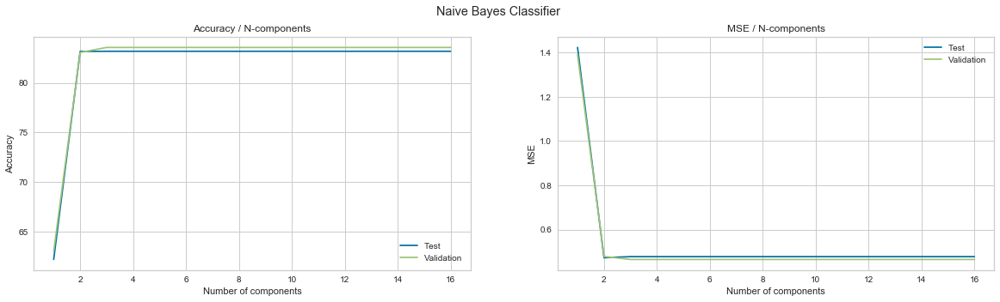

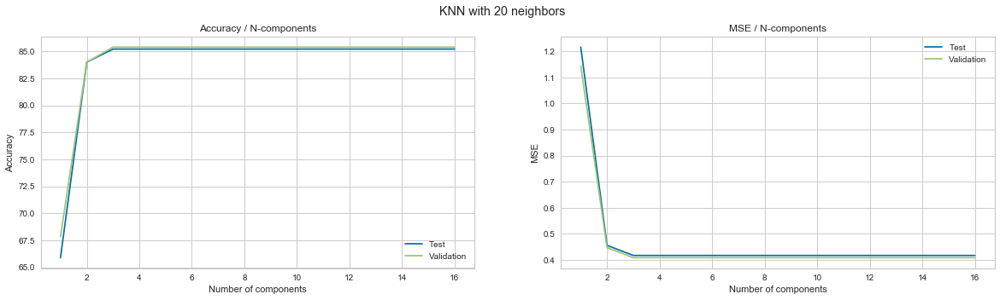

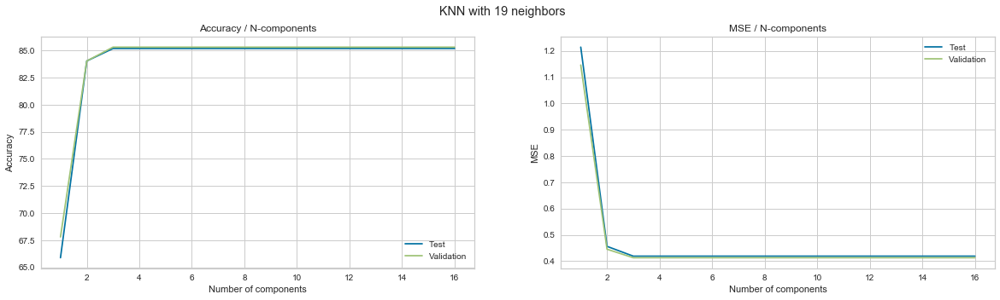

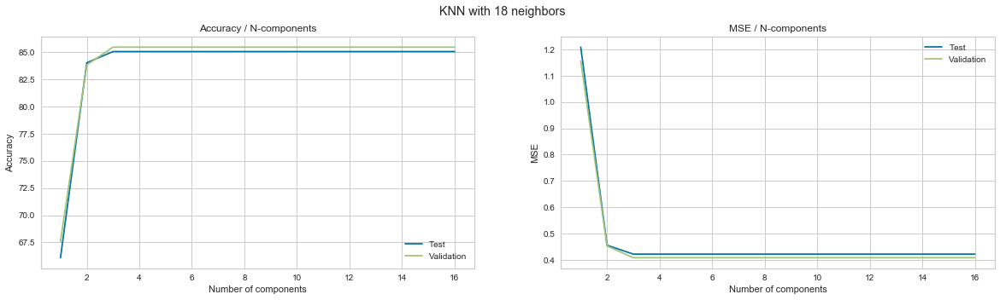

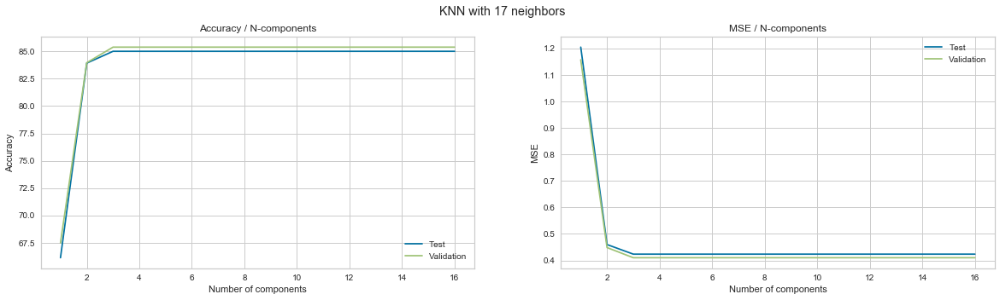

...

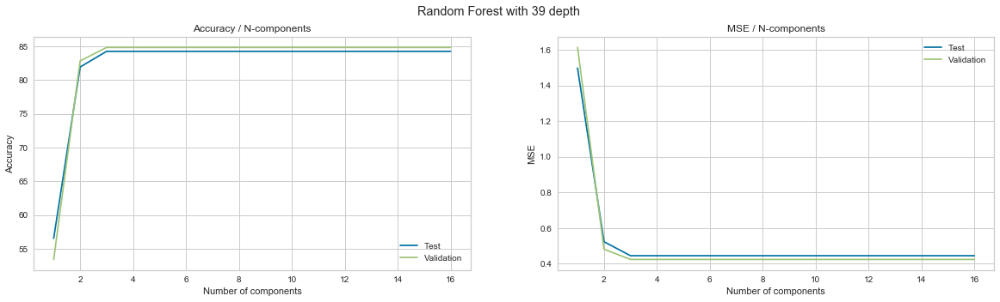

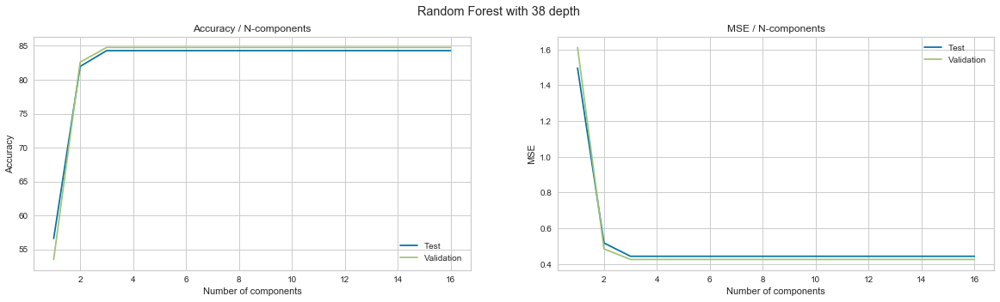

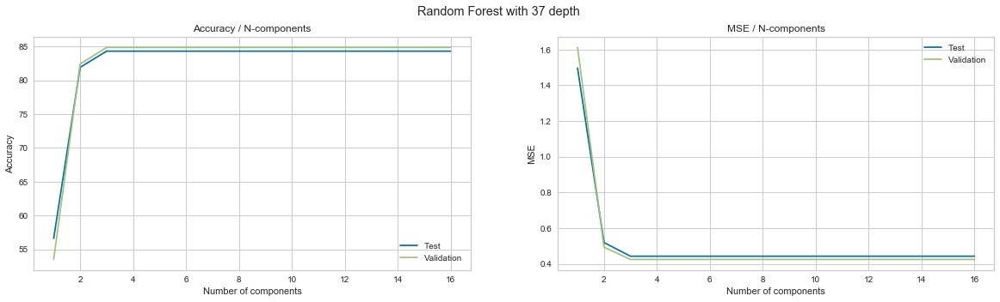

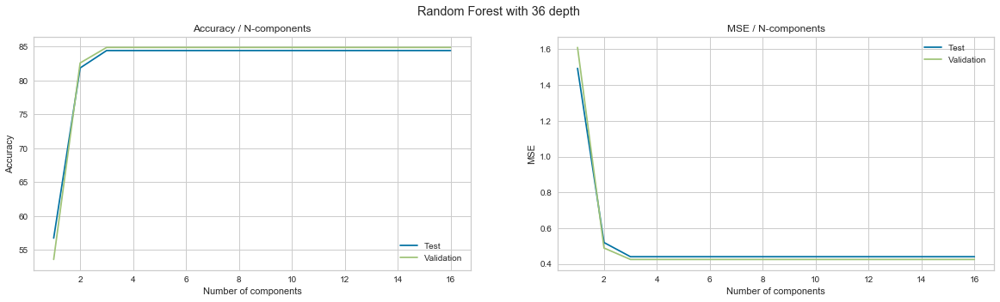

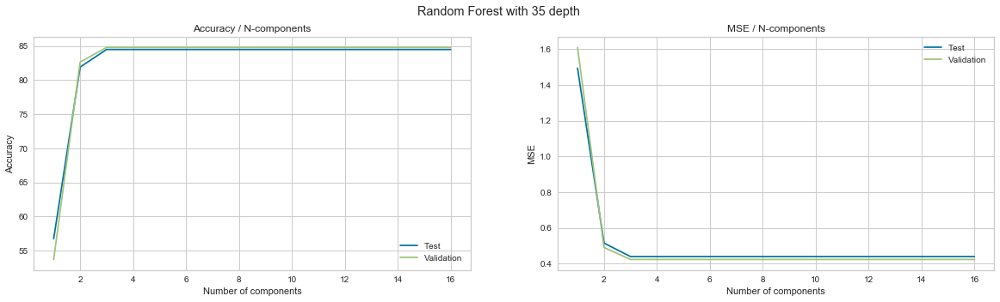

In [82]:
lda_results = test_methods(X,y,'lda')

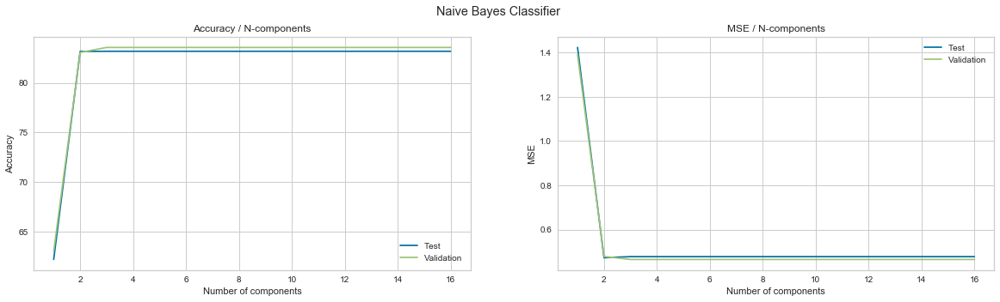

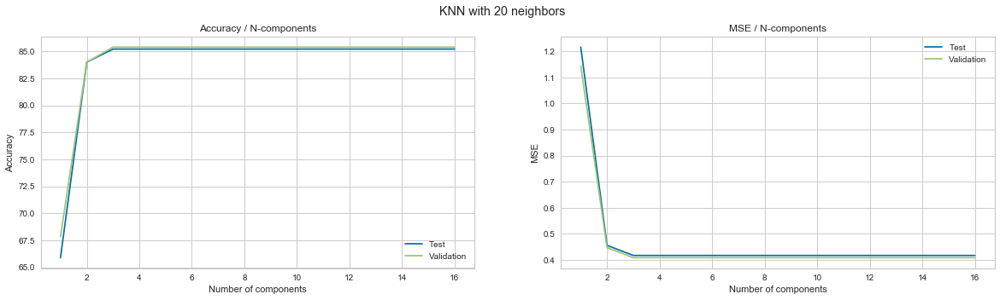

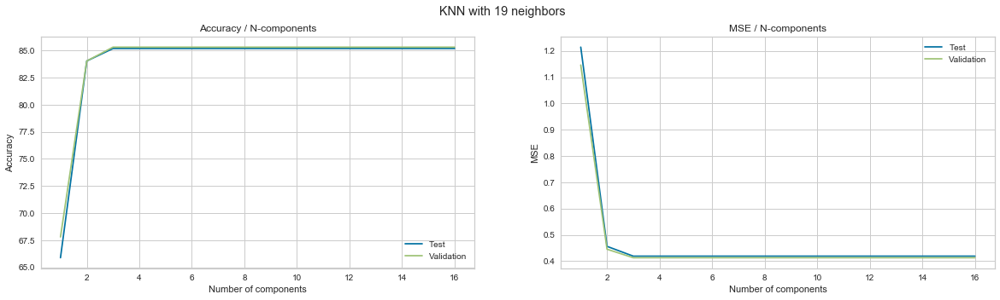

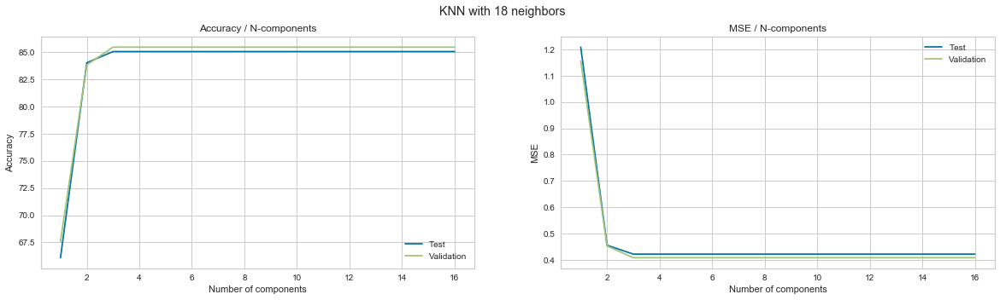

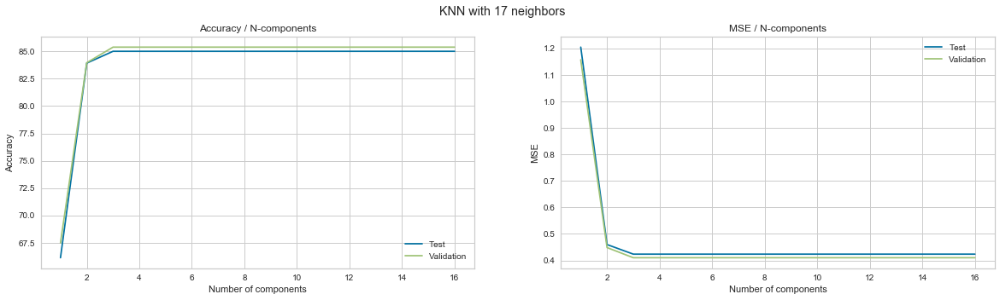

...

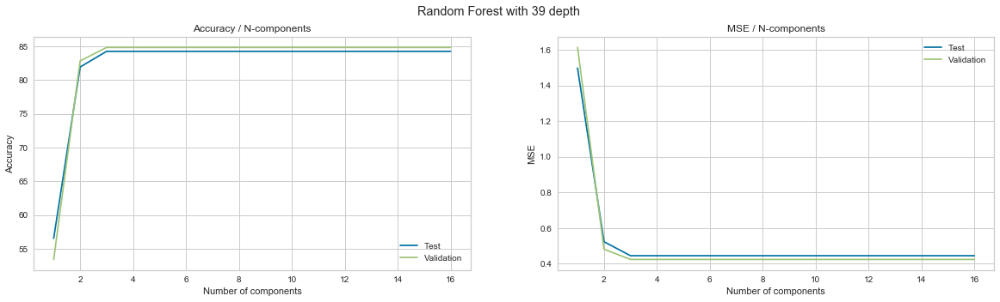

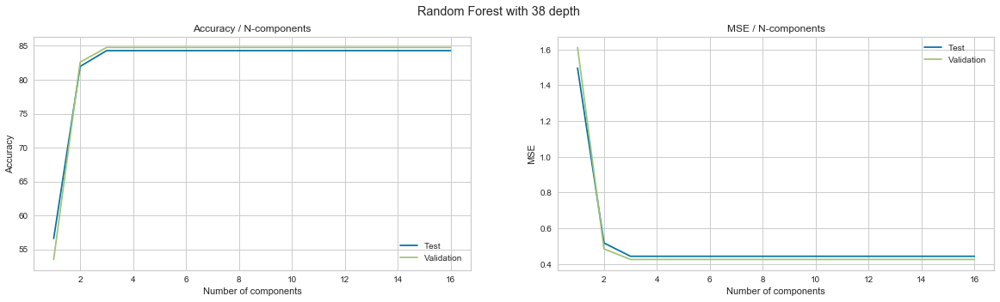

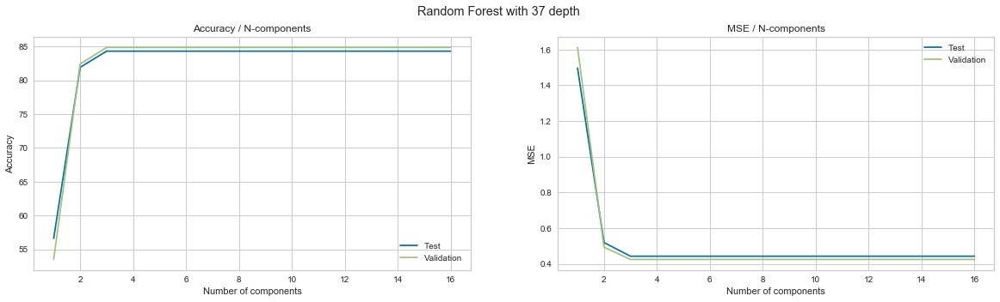

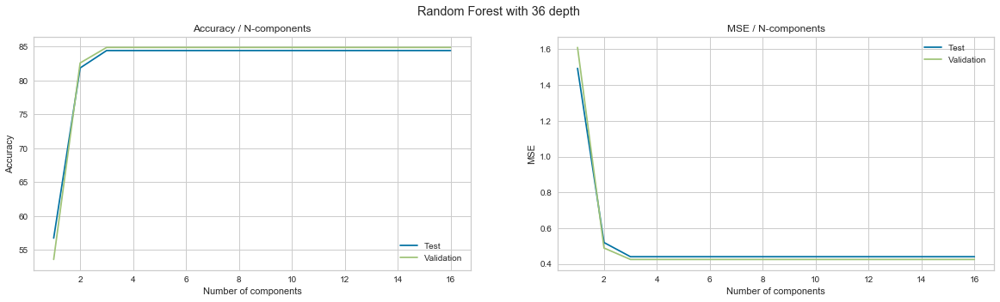

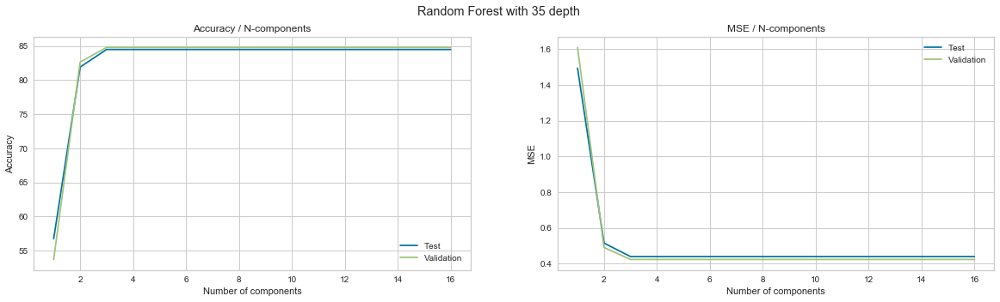

In [128]:
best_lda_results = visualize_results(lda_results)

In [129]:
best_lda_results

[{'algorithm': 'Naive Bayes Classifier',
  'best_test_acc': {'accuracy': 0.8318878460258999, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.8357588357588358, 'n_components': 3},
  'best_test_mse': {'mse': 0.4732089818225021, 'n_components': 2},
  'best_val_mse': {'mse': 0.4653994653994654, 'n_components': 3}},
 {'algorithm': 'KNN with 20 neighbors',
  'best_test_acc': {'accuracy': 0.8520850659379826, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.8538758538758539, 'n_components': 3},
  'best_test_mse': {'mse': 0.41713199477248425, 'n_components': 3},
  'best_val_mse': {'mse': 0.40837540837540837, 'n_components': 3}},
 {'algorithm': 'KNN with 19 neighbors',
  'best_test_acc': {'accuracy': 0.8517286444101224, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.8529848529848529, 'n_components': 3},
  'best_test_mse': {'mse': 0.41879529523583225, 'n_components': 3},
  'best_val_mse': {'mse': 0.41283041283041283, 'n_components': 3}},
 {'algorithm': 'KNN with 18 neighbors',
  'b

In [130]:
select_best_model(best_lda_results)

KNN with 20 neighbors has best accuracy of 0.8520850659379826 at 3 components


Test SVM with small sample for faster computation

Trying with 1 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 53.11572700296736
MSE for  classifier  = 0.9495548961424333
Operation completed in 0.28799962997436523 seconds
____________________________
____________________________________________________________________________________
Trying with 2 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 62.31454005934718
MSE for  classifier  = 0.8694362017804155
Operation completed in 0.266338586807251 seconds
____________________________
____________________________________________________________________________________
Trying with 3 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for clas

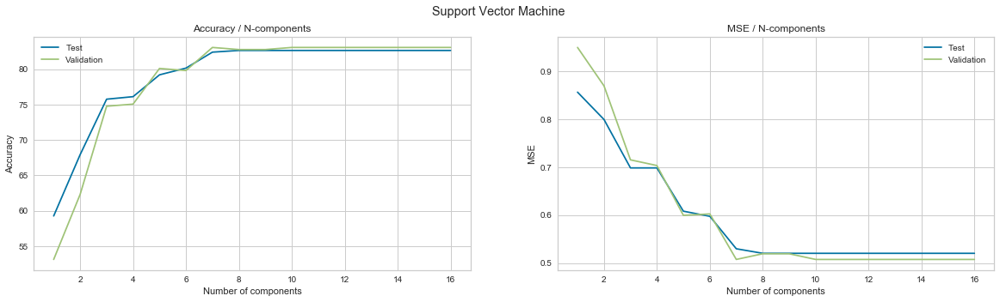

In [83]:
svc_pca_results= test_methods(Xs,ys,"pca",svc=True)

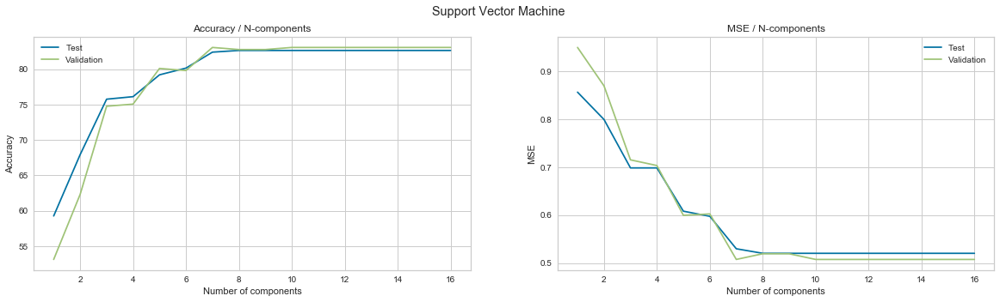

[{'algorithm': 'Support Vector Machine',
  'best_test_acc': {'accuracy': 0.8266033254156769, 'n_components': 8},
  'best_val_acc': {'accuracy': 0.8308605341246291, 'n_components': 7},
  'best_test_mse': {'mse': 0.5201900237529691, 'n_components': 8},
  'best_val_mse': {'mse': 0.5074183976261127, 'n_components': 7}}]

In [139]:
visualize_results(svc_pca_results)

Trying with 1 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 53.11572700296736
MSE for  classifier  = 0.9495548961424333
Operation completed in 0.26343750953674316 seconds
____________________________
____________________________________________________________________________________
Trying with 2 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 64.39169139465875
MSE for  classifier  = 0.8189910979228486
Operation completed in 0.23337650299072266 seconds
____________________________
____________________________________________________________________________________
Trying with 3 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for cl

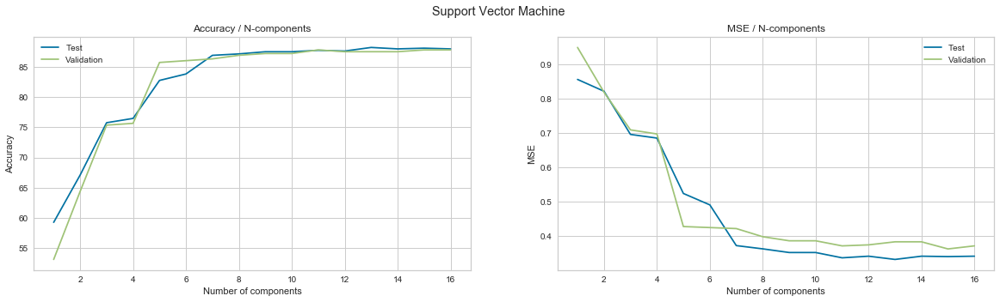

In [84]:
svc_ica_results= test_methods(Xs,ys,"ica",svc=True)

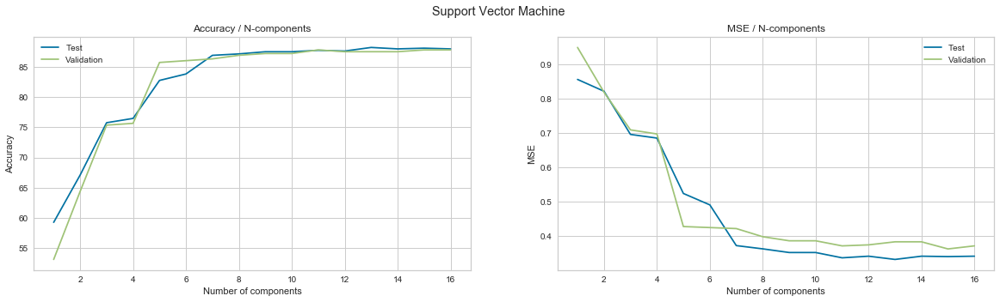

[{'algorithm': 'Support Vector Machine',
  'best_test_acc': {'accuracy': 0.8824228028503563, 'n_components': 13},
  'best_val_acc': {'accuracy': 0.8783382789317508, 'n_components': 11},
  'best_test_mse': {'mse': 0.331353919239905, 'n_components': 13},
  'best_val_mse': {'mse': 0.3620178041543027, 'n_components': 15}}]

In [140]:
visualize_results(svc_ica_results)

Trying with 1 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 58.753709198813056
MSE for  classifier  = 0.9198813056379822
Operation completed in 0.2778480052947998 seconds
____________________________
____________________________________________________________________________________
Trying with 2 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 74.1839762611276
MSE for  classifier  = 0.7626112759643917
Operation completed in 0.19095301628112793 seconds
____________________________
____________________________________________________________________________________
Trying with 3 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for cla

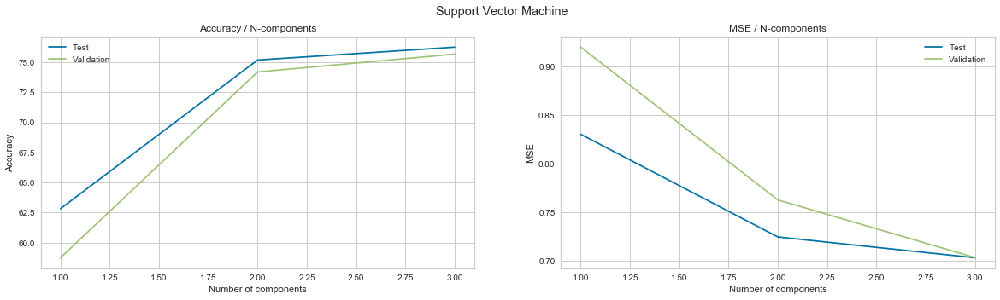

In [85]:
svc_tsne_results= test_methods(Xs,ys,"tsne",svc=True)

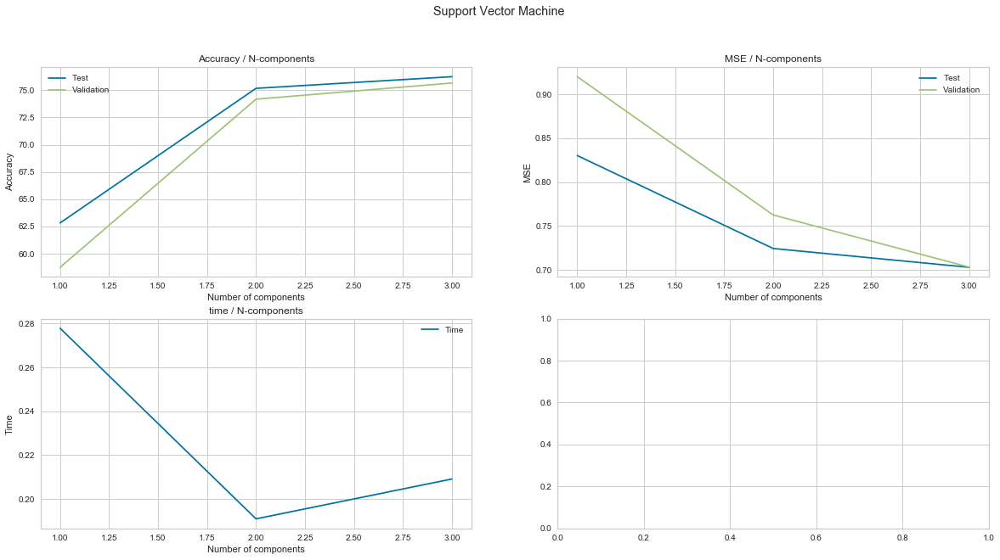

[{'algorithm': 'Support Vector Machine',
  'best_test_acc': {'accuracy': 0.7624703087885986, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.7566765578635015, 'n_components': 3},
  'best_test_mse': {'mse': 0.7030878859857482, 'n_components': 3},
  'best_val_mse': {'mse': 0.7032640949554896, 'n_components': 3}}]

In [158]:
visualize_results(svc_tsne_results)

Trying with 1 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 33.23442136498516
MSE for  classifier  = 3.0712166172106823
Operation completed in 0.3680441379547119 seconds
____________________________
____________________________________________________________________________________
Trying with 2 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 41.839762611275965
MSE for  classifier  = 2.1038575667655786
Operation completed in 0.3372781276702881 seconds
____________________________
____________________________________________________________________________________
Trying with 3 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for cla

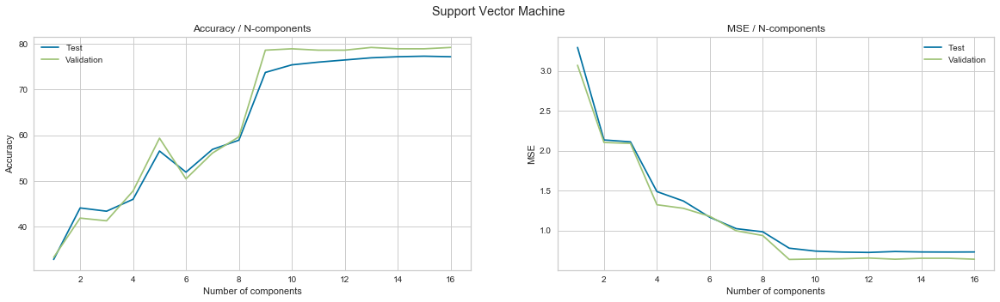

In [86]:
svc_lle_results = test_methods(Xs,ys,'lle',svc=True)

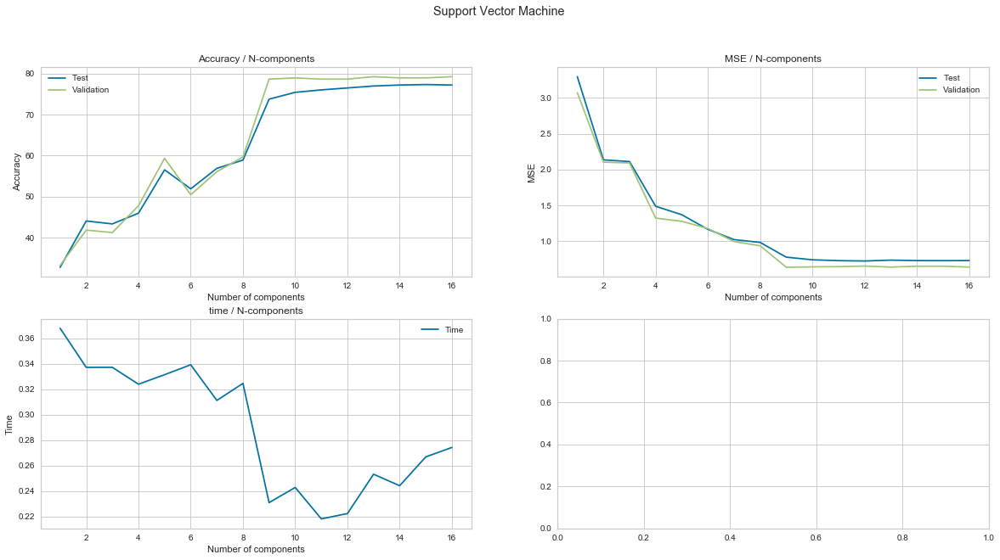

[{'algorithm': 'Support Vector Machine',
  'best_test_acc': {'accuracy': 0.7731591448931117, 'n_components': 15},
  'best_val_acc': {'accuracy': 0.7922848664688428, 'n_components': 13},
  'best_test_mse': {'mse': 0.7256532066508313, 'n_components': 12},
  'best_val_mse': {'mse': 0.6379821958456974, 'n_components': 9}}]

In [157]:
visualize_results(svc_lle_results)

Trying with 1 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 70.62314540059347
MSE for  classifier  = 1.0623145400593472
Operation completed in 0.19208788871765137 seconds
____________________________
____________________________________________________________________________________
Trying with 2 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for classifier = 84.27299703264094
MSE for  classifier  = 0.486646884272997
Operation completed in 0.13164424896240234 seconds
____________________________
____________________________________________________________________________________
Trying with 3 components
____________________________________________________________________________________
Starting to test with Support Vector Machine
Accuracy Score for cla

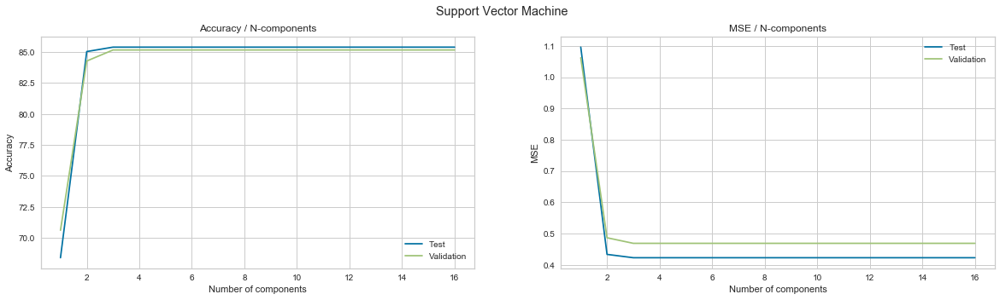

In [87]:
svc_lda_results = test_methods(Xs,ys,'lda',svc=True)

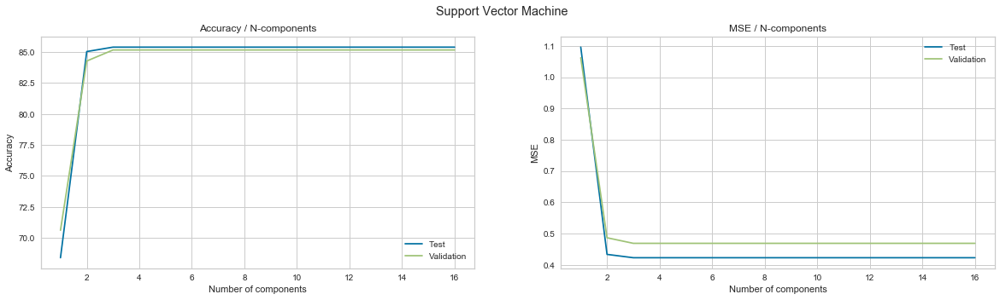

[{'algorithm': 'Support Vector Machine',
  'best_test_acc': {'accuracy': 0.8539192399049881, 'n_components': 3},
  'best_val_acc': {'accuracy': 0.8516320474777448, 'n_components': 3},
  'best_test_mse': {'mse': 0.42280285035629456, 'n_components': 3},
  'best_val_mse': {'mse': 0.4688427299703264, 'n_components': 3}}]

In [141]:
visualize_results(svc_lda_results)